**Imports & Drive Mount**

In [ ]:
#!pip install monai nibabel torch torchvision torchmetrics -q

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from monai.transforms import LoadImaged, EnsureChannelFirstd, Compose, ResizeWithPadOrCropd, NormalizeIntensityd, Orientationd
from monai.networks.nets import UNet
from monai.losses import DiceLoss
from monai.metrics import DiceMetric, HausdorffDistanceMetric
from glob import glob
import copy
#from google.colab import drive

import random
import nibabel as nib
import numpy as np

from torch.utils.tensorboard import SummaryWriter
import matplotlib.pyplot as plt
from tqdm import tqdm
import warnings

In [ ]:
#supress warnings for cleaner console output
warnings.filterwarnings("ignore", category=FutureWarning, module="monai")

In [ ]:
# Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

data_dir = "D:/F25-156/ISLES22_split"
print(data_dir)

D:/F25-156/ISLES22_split


In [ ]:
#save checkpoint and tensorboard logs in drive
checkpoint_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints"
log_dir = "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

os.makedirs(checkpoint_dir, exist_ok=True)
os.makedirs(log_dir, exist_ok=True)

writer = SummaryWriter(log_dir=log_dir)
print(f"Checkpoints will be saved to: {checkpoint_dir}")
print(f"TensorBoard logs will be saved to: {log_dir}")

%load_ext tensorboard
%tensorboard --logdir "D:/F25-156/UNet 3D/Federated_UNet3D_logs"

Checkpoints will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints
TensorBoard logs will be saved to: D:/F25-156/UNet 3D/Federated_UNet3D_logs


Reusing TensorBoard on port 6006 (pid 12720), started 0:13:14 ago. (Use '!kill 12720' to kill it.)

**MONAI Preprocessing Transforms**

In [ ]:
# Target shape for all volumes
target_shape = (96,96,96)

sample_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(keys=["image"], spatial_size=target_shape),
    NormalizeIntensityd(keys=["image"], nonzero=True)
])

mask_transform = Compose([
    LoadImaged(keys=["image"]),
    EnsureChannelFirstd(keys=["image"]),
    Orientationd(keys=["image"], axcodes="RAS"),
    ResizeWithPadOrCropd(
        keys=["image"],
        spatial_size=target_shape,
        mode="constant"
    )
])


**Dataset Class**

In [ ]:
def load_dwi_mask_pairs(base_path):
    dwi_files = sorted(glob(os.path.join(base_path, "DWI", "*.nii*")))
    mask_files = sorted(glob(os.path.join(base_path, "masks", "*.nii*")))
    assert len(dwi_files) == len(mask_files), f"Mismatch in {base_path}"
    return dwi_files, mask_files


In [ ]:
class ISLESDataset(Dataset):
    def __init__(self, dwi_files, mask_files,
                 image_transform=None,
                 mask_transform=None):

        assert len(dwi_files) == len(mask_files)

        self.dwi_files = dwi_files
        self.mask_files = mask_files
        self.image_transform = image_transform
        self.mask_transform = mask_transform

    def __len__(self):
        return len(self.dwi_files)

    def __getitem__(self, idx):

        image_dict = {"image": self.dwi_files[idx]}
        mask_dict = {"image": self.mask_files[idx]}

        if self.image_transform:
            image_dict = self.image_transform(image_dict)

        if self.mask_transform:
            mask_dict = self.mask_transform(mask_dict)

        image = image_dict["image"].float()
        mask = mask_dict["image"].long()

        return {"image": image, "mask": mask}

**Load Files and Apply MONAI Transforms**

**Split into “Clients” (Federated Simulation)**


Client 0 - Raw Samples:
Sample 44 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


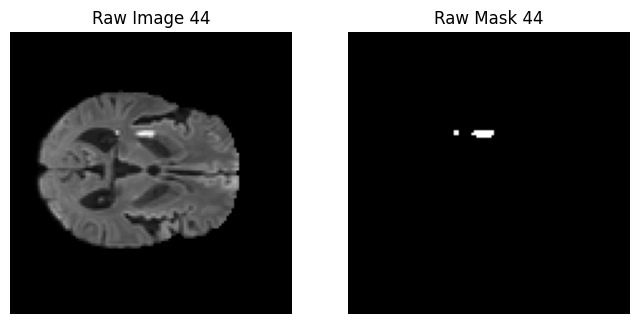

Sample 39 | Image shape: (128, 128, 25) | Mask shape: (128, 128, 25) | Mask Values: tensor([0., 1.], dtype=torch.float64)


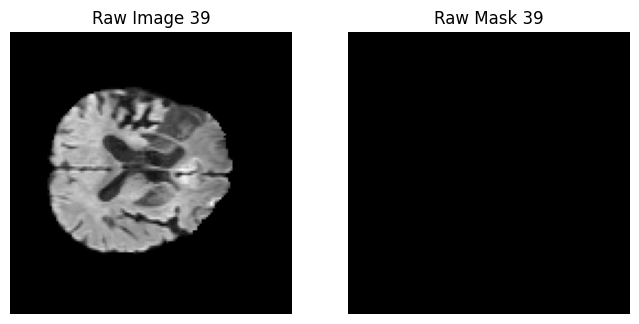

Client 0 - Preprocessed Samples:
Sample 44 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


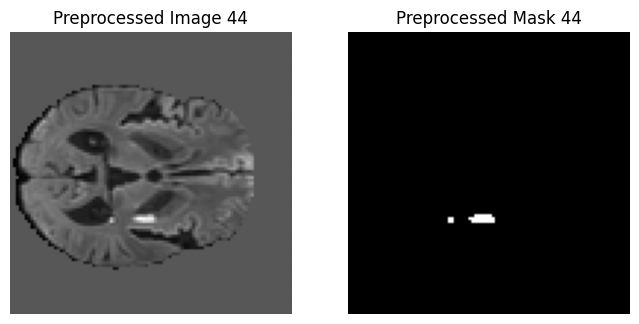

Sample 39 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


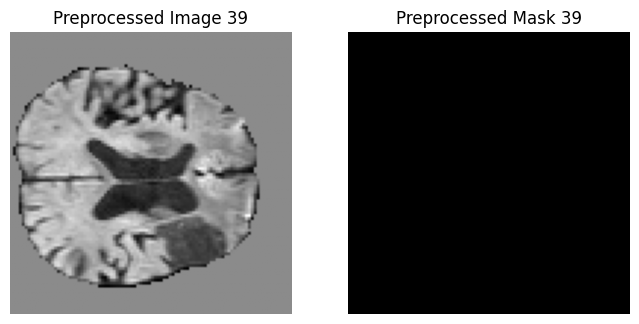

Client 0 samples: 50

Client 1 - Raw Samples:
Sample 5 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


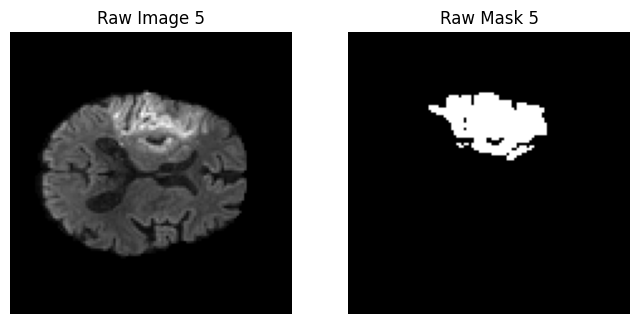

Sample 38 | Image shape: (112, 112, 73) | Mask shape: (112, 112, 73) | Mask Values: tensor([0., 1.], dtype=torch.float64)


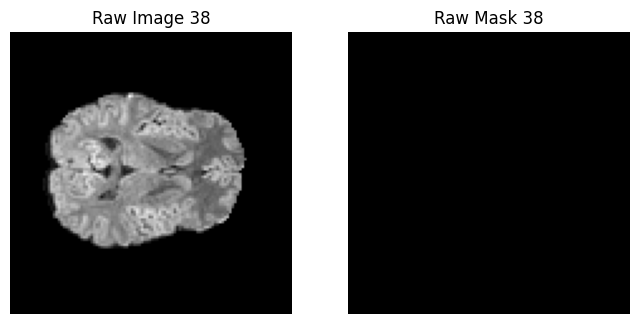

Client 1 - Preprocessed Samples:
Sample 5 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


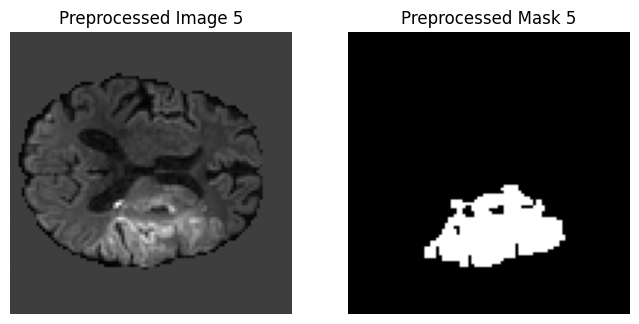

Sample 38 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


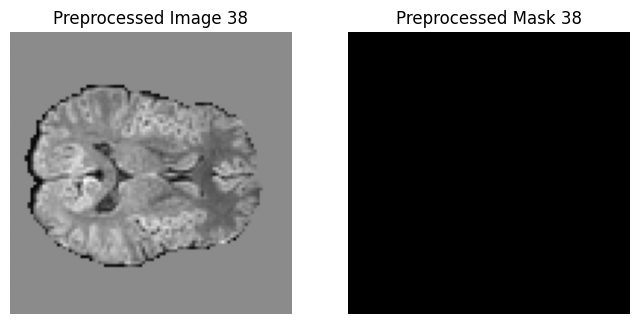

Client 1 samples: 50

Client 2 - Raw Samples:
Sample 22 | Image shape: (112, 112, 74) | Mask shape: (112, 112, 74) | Mask Values: tensor([0., 1.], dtype=torch.float64)


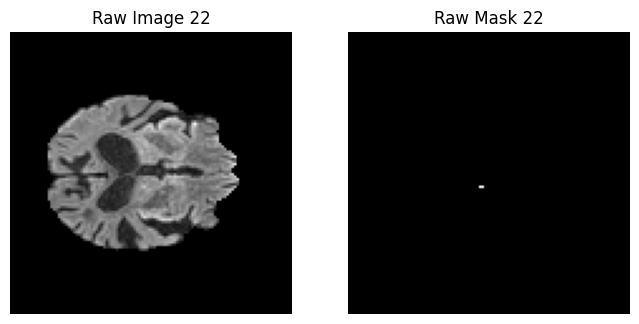

Sample 17 | Image shape: (112, 112, 72) | Mask shape: (112, 112, 72) | Mask Values: tensor([0., 1.], dtype=torch.float64)


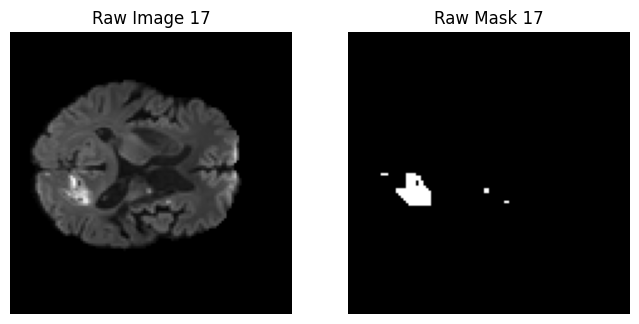

Client 2 - Preprocessed Samples:
Sample 22 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


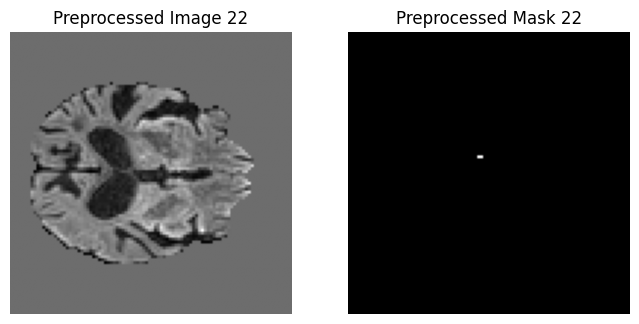

Sample 17 | Image shape: (96, 96, 96) | Mask shape: (96, 96, 96)  | Mask Values: tensor([0, 1])


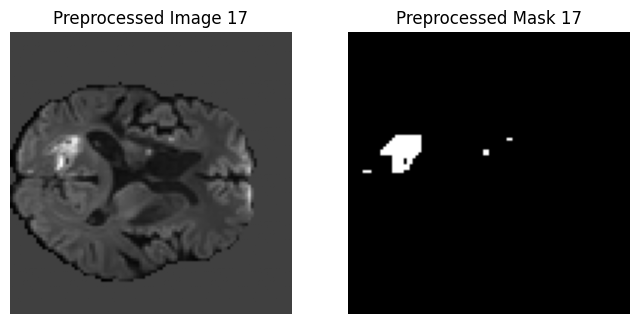

Client 2 samples: 50


In [ ]:
num_clients = 3
client_datasets = []

for i in range(num_clients):
    client_path = os.path.join(data_dir, "train", f"client_{i}")
    dwi_files, mask_files = load_dwi_mask_pairs(client_path)

    # -----------------------------
    # Visualize 2 random raw samples
    # -----------------------------
    sample_indices = random.sample(range(len(dwi_files)), k=2)
    print(f"\nClient {i} - Raw Samples:")
    for idx in sample_indices:
        img = nib.load(dwi_files[idx]).get_fdata()
        mask = nib.load(mask_files[idx]).get_fdata()
        mask_tensor = torch.from_numpy(mask)

        print(f"Sample {idx} | Image shape: {img.shape} | Mask shape: {mask.shape} | Mask Values: {torch.unique(mask_tensor)}")  #make sure mask only contains 0 and 1

        mid_slice = img.shape[2] // 2  # middle slice
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask[:,:,mid_slice], cmap="gray")
        plt.title(f"Raw Mask {idx}")
        plt.axis("off")
        plt.show()

    # -----------------------------
    # Create preprocessed dataset
    # -----------------------------
    ds = ISLESDataset(
        dwi_files=dwi_files,
        mask_files=mask_files,
        image_transform=sample_transform,
        mask_transform=mask_transform
    )
    client_datasets.append(ds)

    # -----------------------------
    # Visualize 2 random preprocessed samples
    # -----------------------------
    print(f"Client {i} - Preprocessed Samples:")
    for idx in sample_indices:
        sample = ds[idx]
        img_proc = sample["image"][0].numpy()  # remove channel
        mask_proc = sample["mask"][0].numpy()
        print(f"Sample {idx} | Image shape: {img_proc.shape} | Mask shape: {mask_proc.shape}  | Mask Values: {torch.unique(sample['mask'])}")

        mid_slice = img_proc.shape[2] // 2
        plt.figure(figsize=(8,4))
        plt.subplot(1,2,1)
        plt.imshow(img_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Image {idx}")
        plt.axis("off")
        plt.subplot(1,2,2)
        plt.imshow(mask_proc[:,:,mid_slice], cmap="gray")
        plt.title(f"Preprocessed Mask {idx}")
        plt.axis("off")
        plt.show()

    print(f"Client {i} samples: {len(ds)}")

**Validation Set**

In [ ]:
val_dwi, val_masks = load_dwi_mask_pairs(os.path.join(data_dir, "val"))

val_dataset = ISLESDataset(
    dwi_files=val_dwi,
    mask_files=val_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)

print("Validation samples:", len(val_dataset))

Validation samples: 50


UNet

In [ ]:
print("CUDA version:", torch.version.cuda)
print("CUDA available:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

CUDA version: 12.1
CUDA available: True
GPU: NVIDIA RTX A4000


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

def create_model():
    model = UNet(
        spatial_dims=3,
        in_channels=1,
        out_channels=1,
        channels=(16, 32, 64, 128),
        strides=(2, 2, 2),
        num_res_units=2
    ).to(device)
    print(model)
    return model

Using device: cuda:0


**Client Class**

In [ ]:
class Client:
    def __init__(self, client_id, dataset, device):
        self.id = client_id
        self.loader = DataLoader(dataset, batch_size=1, shuffle=True)
        self.device = device
        self.model = create_model().to(device)
        self.optimizer = optim.Adam(self.model.parameters(), lr=1e-4)
        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + 0.3*self.bce_loss(y_pred, y_true)

    def get_parameters(self):
        return {k: v.cpu().clone() for k, v in self.model.state_dict().items()}

    def set_parameters(self, parameters):
        self.model.load_state_dict(parameters)


    def train_epochs(self, num_epochs=1):
        self.model.train()
        total_loss = 0

        # Progress bar for epochs
        for epoch in tqdm(range(1, num_epochs + 1), desc=f"Client {self.id} Epochs", leave=True):
            epoch_loss = 0

            for batch in self.loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                self.optimizer.zero_grad()
                outputs = self.model(images)
                loss = self.loss_fn(outputs, masks)
                loss.backward()
                self.optimizer.step()

                total_loss += loss.item()
                epoch_loss += loss.item()

                # Metrics for monitoring
                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

            # Compute metrics at the end of the epoch
            mean_dice = self.dice_metric.aggregate().item()
            # mean_hd95 = self.hd_metric.aggregate().item()
            try:
                mean_hd95 = self.hd_metric.aggregate().item()
            except ValueError:
                mean_hd95 = float('nan')  # or 0
            mean_iou = mean_dice / (2 - mean_dice)

            # Print per-epoch metrics
            print(f"Client {self.id} | Epoch {epoch}/{num_epochs} | "
                  f"Loss: {epoch_loss/len(self.loader):.4f} | Dice: {mean_dice:.4f} | "
                  f"IoU: {mean_iou:.4f} | HD95: {mean_hd95:.4f}")

            # Reset metrics for next epoch
            self.dice_metric.reset()
            self.hd_metric.reset()

        # Average loss across all epochs
        avg_loss = total_loss / (len(self.loader) * num_epochs)

        # Return last epoch metrics (or you can average them if you prefer)
        return avg_loss, mean_dice, mean_iou, mean_hd95

**Server Class (FedAvg)**

In [ ]:
class Server:
    def __init__(self, val_loader, device):
        self.device = device
        self.global_model = create_model().to(device)
        self.val_loader = val_loader

        self.dice_loss = DiceLoss(sigmoid=True)
        self.bce_loss = nn.BCEWithLogitsLoss()

        self.dice_metric = DiceMetric(include_background=False, reduction="mean")
        self.hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

        self.best_dice = 0.0

    def loss_fn(self, y_pred, y_true):
        return 0.7*self.dice_loss(y_pred, y_true) + \
               0.3*self.bce_loss(y_pred, y_true)

    def aggregate(self, client_params_list):
        new_params = copy.deepcopy(client_params_list[0])

        for key in new_params.keys():
            for i in range(1, len(client_params_list)):
                new_params[key] += client_params_list[i][key]
            new_params[key] /= len(client_params_list)

        self.global_model.load_state_dict(new_params)

    def distribute(self, clients):
        global_params = self.global_model.state_dict()
        for client in clients:
            client.set_parameters(global_params)

    def validate(self):
        self.global_model.eval()
        val_loss = 0

        with torch.no_grad():
            for batch in self.val_loader:
                images = batch["image"].to(self.device, dtype=torch.float32)
                masks = batch["mask"].to(self.device, dtype=torch.float32)

                outputs = self.global_model(images)
                loss = self.loss_fn(outputs, masks)
                val_loss += loss.item()

                pred_binary = (torch.sigmoid(outputs) > 0.5).float()
                self.dice_metric(pred_binary, masks)
                if masks.sum() > 0 and pred_binary.sum() > 0:
                  self.hd_metric(pred_binary, masks)

        avg_loss = val_loss / len(self.val_loader)
        mean_dice = self.dice_metric.aggregate().item()
        # mean_hd95 = self.hd_metric.aggregate().item()
        try:
            mean_hd95 = self.hd_metric.aggregate().item()
        except ValueError:
            mean_hd95 = float('nan')  # or 0
        mean_iou = mean_dice / (2 - mean_dice)

        self.dice_metric.reset()
        self.hd_metric.reset()

        # Save best global model
        if mean_dice > self.best_dice:
            self.best_dice = mean_dice
            torch.save({
                "model_state_dict": self.global_model.state_dict(),
                "dice": mean_dice
            }, "best_global_model.pth")
            print(f"Best global model updated with Dice={mean_dice:.4f}")


        return avg_loss, mean_dice, mean_iou, mean_hd95

In [ ]:
#create client and server objects
clients = [
    Client(client_id=i, dataset=client_datasets[i], device=device)
    for i in range(num_clients)
]

server = Server(val_loader=val_loader, device=device)

UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
          (conv): Se

**Federated Training loop**

In [ ]:
communication_rounds = 50  # upper bound
local_epochs = 5
dice_threshold = 0.001

# ---- Added early stopping tracking ----
no_improve_rounds = 0
patience = 5   # stop if Dice does not improve for 5 rounds
# --------------------------------------

global_history = {"dice": [], "loss": [], "iou": [], "hd95": []}
client_history = {client.id: {"loss": [], "dice": [], "iou": [], "hd95": []} for client in clients}

previous_dice = 0

for round_num in range(1, communication_rounds + 1):

    print(f"\n--- Communication Round {round_num} ---")

    # ---- Distribute global model ----
    server.distribute(clients)

    client_params = []

    # ---- Local Training ----
    for client in tqdm(clients, desc="Clients Training", leave=False):

        # train_epochs already runs for `local_epochs`
        train_loss, train_dice, train_iou, train_hd95 = client.train_epochs(local_epochs)

        # Save per-client metrics
        client_history[client.id]["loss"].append(train_loss)
        client_history[client.id]["dice"].append(train_dice)
        client_history[client.id]["iou"].append(train_iou)
        client_history[client.id]["hd95"].append(train_hd95)

        # TensorBoard logging
        writer.add_scalar(f"Client_{client.id}/Loss", train_loss, round_num)
        writer.add_scalar(f"Client_{client.id}/Dice", train_dice, round_num)
        writer.add_scalar(f"Client_{client.id}/IoU", train_iou, round_num)
        writer.add_scalar(f"Client_{client.id}/HD95", train_hd95, round_num)


        client_params.append(client.get_parameters())

        tqdm.write(f"Client {client.id} | Loss={train_loss:.4f} | Dice={train_dice:.4f} | IoU={train_iou:.4f} | HD95={train_hd95:.4f}")
    # ---- Aggregate client models ----
    server.aggregate(client_params)

    # ---- Validation on global model ----
    val_loss, val_dice, val_iou, val_hd95 = server.validate()

    global_history["loss"].append(val_loss)
    global_history["dice"].append(val_dice)
    global_history["iou"].append(val_iou)
    global_history["hd95"].append(val_hd95)

    # TensorBoard logging
    writer.add_scalar("Global/Val_Loss", val_loss, round_num)
    writer.add_scalar("Global/Val_Dice", val_dice, round_num)
    writer.add_scalar("Global/Val_IoU", val_iou, round_num)
    writer.add_scalar("Global/Val_HD95", val_hd95, round_num)


    print(f"Global | Val Loss={val_loss:.4f} | Dice={val_dice:.4f} | IoU={val_iou:.4f} | HD95={val_hd95:.4f}")

    # Save checkpoint of current round
    checkpoint_path = os.path.join(checkpoint_dir, f"federated_round{round_num}.pth")
    torch.save({
        "round": round_num,
        "global_model_state_dict": server.global_model.state_dict(),
        "global_val_loss": val_loss,
        "global_val_dice": val_dice,
        "global_val_iou": val_iou,
        "global_val_hd95": val_hd95,
        "client_history": client_history
    }, checkpoint_path)
    print(f"Checkpoint saved for round {round_num} at {checkpoint_path}")

        # ---- Early stopping check based on validation Dice ----
    if val_dice > previous_dice + dice_threshold:
        no_improve_rounds = 0
    else:
        no_improve_rounds += 1
        print(f"No significant Dice improvement for {no_improve_rounds} round(s)")

    if no_improve_rounds >= patience:
        print(f"Early stopping triggered at round {round_num} (no Dice improvement for {patience} rounds)")
        break
    # -------------------------------------------------------
    previous_dice = val_dice

writer.close()


--- Communication Round 1 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.9377 | Dice: 0.0041 | IoU: 0.0020 | HD95: 65.3060


Client 0 | Epoch 2/5 | Loss: 0.9258 | Dice: 0.0049 | IoU: 0.0025 | HD95: 65.1184


Client 0 | Epoch 3/5 | Loss: 0.9219 | Dice: 0.0052 | IoU: 0.0026 | HD95: 65.0215


Client 0 | Epoch 4/5 | Loss: 0.9195 | Dice: 0.0052 | IoU: 0.0026 | HD95: 64.8630


Clients Training:  33%|███▎      | 1/3 [00:48<01:37, 48.64s/it]

Client 0 | Epoch 5/5 | Loss: 0.9176 | Dice: 0.0052 | IoU: 0.0026 | HD95: 64.8578
Client 0 | Loss=0.9245 | Dice=0.0052 | IoU=0.0026 | HD95=64.8578


Client 1 | Epoch 1/5 | Loss: 0.9380 | Dice: 0.0041 | IoU: 0.0021 | HD95: 61.9642


Client 1 | Epoch 2/5 | Loss: 0.9259 | Dice: 0.0047 | IoU: 0.0024 | HD95: 61.7562


Client 1 | Epoch 3/5 | Loss: 0.9222 | Dice: 0.0048 | IoU: 0.0024 | HD95: 61.5192


Client 1 | Epoch 4/5 | Loss: 0.9198 | Dice: 0.0049 | IoU: 0.0025 | HD95: 61.3868


Clients Training:  67%|██████▋   | 2/3 [01:34<00:46, 46.99s/it]

Client 1 | Epoch 5/5 | Loss: 0.9179 | Dice: 0.0049 | IoU: 0.0025 | HD95: 61.4891
Client 1 | Loss=0.9248 | Dice=0.0049 | IoU=0.0025 | HD95=61.4891


Client 2 | Epoch 1/5 | Loss: 0.9368 | Dice: 0.0048 | IoU: 0.0024 | HD95: 63.4951


Client 2 | Epoch 2/5 | Loss: 0.9249 | Dice: 0.0057 | IoU: 0.0028 | HD95: 63.4754


Client 2 | Epoch 3/5 | Loss: 0.9210 | Dice: 0.0060 | IoU: 0.0030 | HD95: 63.1817


Client 2 | Epoch 4/5 | Loss: 0.9187 | Dice: 0.0061 | IoU: 0.0031 | HD95: 63.2002


Client 2 Epochs: 100%|██████████| 5/5 [00:44<00:00,  8.96s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.9169 | Dice: 0.0061 | IoU: 0.0031 | HD95: 63.1791
Client 2 | Loss=0.9236 | Dice=0.0061 | IoU=0.0031 | HD95=63.1791


Best global model updated with Dice=0.0023
Global | Val Loss=0.9197 | Dice=0.0023 | IoU=0.0011 | HD95=66.3255
Checkpoint saved for round 1 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round1.pth

--- Communication Round 2 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.9152 | Dice: 0.0058 | IoU: 0.0029 | HD95: 65.0782


Client 0 | Epoch 2/5 | Loss: 0.9027 | Dice: 0.0110 | IoU: 0.0056 | HD95: 66.2270


Client 0 | Epoch 3/5 | Loss: 0.8867 | Dice: 0.0177 | IoU: 0.0089 | HD95: 67.4705


Client 0 | Epoch 4/5 | Loss: 0.8752 | Dice: 0.0194 | IoU: 0.0098 | HD95: 68.6137


Clients Training:  33%|███▎      | 1/3 [00:43<01:27, 43.61s/it]

Client 0 | Epoch 5/5 | Loss: 0.8661 | Dice: 0.0206 | IoU: 0.0104 | HD95: 68.9399
Client 0 | Loss=0.8892 | Dice=0.0206 | IoU=0.0104 | HD95=68.9399


Client 1 | Epoch 1/5 | Loss: 0.9154 | Dice: 0.0056 | IoU: 0.0028 | HD95: 61.6805


Client 1 | Epoch 2/5 | Loss: 0.9026 | Dice: 0.0100 | IoU: 0.0050 | HD95: 62.7938


Client 1 | Epoch 3/5 | Loss: 0.8867 | Dice: 0.0156 | IoU: 0.0079 | HD95: 64.2391


Client 1 | Epoch 4/5 | Loss: 0.8752 | Dice: 0.0174 | IoU: 0.0088 | HD95: 65.3379


Clients Training:  67%|██████▋   | 2/3 [01:28<00:44, 44.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.8660 | Dice: 0.0184 | IoU: 0.0093 | HD95: 65.7434
Client 1 | Loss=0.8892 | Dice=0.0184 | IoU=0.0093 | HD95=65.7434


Client 2 | Epoch 1/5 | Loss: 0.9146 | Dice: 0.0068 | IoU: 0.0034 | HD95: 63.6036


Client 2 | Epoch 2/5 | Loss: 0.9033 | Dice: 0.0119 | IoU: 0.0060 | HD95: 64.4935


Client 2 | Epoch 3/5 | Loss: 0.8863 | Dice: 0.0196 | IoU: 0.0099 | HD95: 65.9301


Client 2 | Epoch 4/5 | Loss: 0.8742 | Dice: 0.0215 | IoU: 0.0109 | HD95: 67.3232


Client 2 Epochs: 100%|██████████| 5/5 [00:44<00:00,  8.91s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.8648 | Dice: 0.0227 | IoU: 0.0115 | HD95: 67.8998
Client 2 | Loss=0.8886 | Dice=0.0227 | IoU=0.0115 | HD95=67.8998


Best global model updated with Dice=0.0089
Global | Val Loss=0.8662 | Dice=0.0089 | IoU=0.0045 | HD95=70.9658
Checkpoint saved for round 2 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round2.pth

--- Communication Round 3 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.8581 | Dice: 0.0214 | IoU: 0.0108 | HD95: 69.1100


Client 0 | Epoch 2/5 | Loss: 0.8510 | Dice: 0.0225 | IoU: 0.0114 | HD95: 69.1802


Client 0 | Epoch 3/5 | Loss: 0.8442 | Dice: 0.0242 | IoU: 0.0122 | HD95: 69.1758


Client 0 | Epoch 4/5 | Loss: 0.8379 | Dice: 0.0252 | IoU: 0.0127 | HD95: 69.0831


Clients Training:  33%|███▎      | 1/3 [00:41<01:23, 41.61s/it]

Client 0 | Epoch 5/5 | Loss: 0.8320 | Dice: 0.0270 | IoU: 0.0137 | HD95: 69.0557
Client 0 | Loss=0.8446 | Dice=0.0270 | IoU=0.0137 | HD95=69.0557


Client 1 | Epoch 1/5 | Loss: 0.8586 | Dice: 0.0193 | IoU: 0.0098 | HD95: 65.8490


Client 1 | Epoch 2/5 | Loss: 0.8514 | Dice: 0.0208 | IoU: 0.0105 | HD95: 65.9070


Client 1 | Epoch 3/5 | Loss: 0.8446 | Dice: 0.0217 | IoU: 0.0109 | HD95: 65.8855


Client 1 | Epoch 4/5 | Loss: 0.8384 | Dice: 0.0229 | IoU: 0.0116 | HD95: 65.7717


Clients Training:  67%|██████▋   | 2/3 [01:24<00:42, 42.46s/it]

Client 1 | Epoch 5/5 | Loss: 0.8323 | Dice: 0.0244 | IoU: 0.0124 | HD95: 65.7426
Client 1 | Loss=0.8451 | Dice=0.0244 | IoU=0.0124 | HD95=65.7426


Client 2 | Epoch 1/5 | Loss: 0.8568 | Dice: 0.0240 | IoU: 0.0121 | HD95: 67.8327


Client 2 | Epoch 2/5 | Loss: 0.8495 | Dice: 0.0253 | IoU: 0.0128 | HD95: 67.8877


Client 2 | Epoch 3/5 | Loss: 0.8426 | Dice: 0.0263 | IoU: 0.0133 | HD95: 67.8878


Client 2 | Epoch 4/5 | Loss: 0.8362 | Dice: 0.0283 | IoU: 0.0143 | HD95: 67.7617


Client 2 Epochs: 100%|██████████| 5/5 [00:44<00:00,  8.80s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.8301 | Dice: 0.0306 | IoU: 0.0155 | HD95: 67.7225
Client 2 | Loss=0.8430 | Dice=0.0306 | IoU=0.0155 | HD95=67.7225


Best global model updated with Dice=0.0119
Global | Val Loss=0.8339 | Dice=0.0119 | IoU=0.0060 | HD95=70.8703
Checkpoint saved for round 3 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round3.pth

--- Communication Round 4 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.8262 | Dice: 0.0284 | IoU: 0.0144 | HD95: 68.9865


Client 0 | Epoch 2/5 | Loss: 0.8200 | Dice: 0.0322 | IoU: 0.0164 | HD95: 68.0541


Client 0 | Epoch 3/5 | Loss: 0.8115 | Dice: 0.0349 | IoU: 0.0177 | HD95: 68.5468


Client 0 | Epoch 4/5 | Loss: 0.8058 | Dice: 0.0347 | IoU: 0.0176 | HD95: 68.9077


Clients Training:  33%|███▎      | 1/3 [00:42<01:25, 42.53s/it]

Client 0 | Epoch 5/5 | Loss: 0.7992 | Dice: 0.0378 | IoU: 0.0192 | HD95: 69.6781
Client 0 | Loss=0.8126 | Dice=0.0378 | IoU=0.0192 | HD95=69.6781


Client 1 | Epoch 1/5 | Loss: 0.8267 | Dice: 0.0260 | IoU: 0.0132 | HD95: 65.6378


Client 1 | Epoch 2/5 | Loss: 0.8202 | Dice: 0.0299 | IoU: 0.0152 | HD95: 65.1833


Client 1 | Epoch 3/5 | Loss: 0.8120 | Dice: 0.0319 | IoU: 0.0162 | HD95: 65.2852


Client 1 | Epoch 4/5 | Loss: 0.8041 | Dice: 0.0341 | IoU: 0.0174 | HD95: 66.0168


Clients Training:  67%|██████▋   | 2/3 [01:25<00:42, 42.72s/it]

Client 1 | Epoch 5/5 | Loss: 0.7979 | Dice: 0.0374 | IoU: 0.0191 | HD95: 66.4692
Client 1 | Loss=0.8122 | Dice=0.0374 | IoU=0.0191 | HD95=66.4692


Client 2 | Epoch 1/5 | Loss: 0.8246 | Dice: 0.0320 | IoU: 0.0163 | HD95: 67.6071


Client 2 | Epoch 2/5 | Loss: 0.8176 | Dice: 0.0372 | IoU: 0.0189 | HD95: 66.9622


Client 2 | Epoch 3/5 | Loss: 0.8094 | Dice: 0.0407 | IoU: 0.0208 | HD95: 67.2413


Client 2 | Epoch 4/5 | Loss: 0.8023 | Dice: 0.0442 | IoU: 0.0226 | HD95: 67.7915


Client 2 Epochs: 100%|██████████| 5/5 [00:42<00:00,  8.45s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7955 | Dice: 0.0508 | IoU: 0.0260 | HD95: 68.4680
Client 2 | Loss=0.8099 | Dice=0.0508 | IoU=0.0260 | HD95=68.4680


Best global model updated with Dice=0.0204
Global | Val Loss=0.8005 | Dice=0.0204 | IoU=0.0103 | HD95=71.5665
Checkpoint saved for round 4 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round4.pth

--- Communication Round 5 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7914 | Dice: 0.0455 | IoU: 0.0233 | HD95: 70.0674


Client 0 | Epoch 2/5 | Loss: 0.7851 | Dice: 0.0479 | IoU: 0.0245 | HD95: 70.0128


Client 0 | Epoch 3/5 | Loss: 0.7771 | Dice: 0.0546 | IoU: 0.0280 | HD95: 70.4348


Client 0 | Epoch 4/5 | Loss: 0.7719 | Dice: 0.0570 | IoU: 0.0293 | HD95: 70.1509


Clients Training:  33%|███▎      | 1/3 [00:40<01:21, 40.71s/it]

Client 0 | Epoch 5/5 | Loss: 0.7653 | Dice: 0.1083 | IoU: 0.0573 | HD95: 70.2794
Client 0 | Loss=0.7782 | Dice=0.1083 | IoU=0.0573 | HD95=70.2794


Client 1 | Epoch 1/5 | Loss: 0.7921 | Dice: 0.0411 | IoU: 0.0210 | HD95: 66.7946


Client 1 | Epoch 2/5 | Loss: 0.7843 | Dice: 0.0483 | IoU: 0.0247 | HD95: 66.8825


Client 1 | Epoch 3/5 | Loss: 0.7780 | Dice: 0.0514 | IoU: 0.0264 | HD95: 67.0743


Client 1 | Epoch 4/5 | Loss: 0.7721 | Dice: 0.0585 | IoU: 0.0301 | HD95: 66.9125


Clients Training:  67%|██████▋   | 2/3 [01:22<00:41, 41.49s/it]

Client 1 | Epoch 5/5 | Loss: 0.7647 | Dice: 0.1174 | IoU: 0.0624 | HD95: 67.8502
Client 1 | Loss=0.7782 | Dice=0.1174 | IoU=0.0624 | HD95=67.8502


Client 2 | Epoch 1/5 | Loss: 0.7894 | Dice: 0.0548 | IoU: 0.0282 | HD95: 68.8245


Client 2 | Epoch 2/5 | Loss: 0.7810 | Dice: 0.0654 | IoU: 0.0338 | HD95: 69.0341


Client 2 | Epoch 3/5 | Loss: 0.7752 | Dice: 0.0668 | IoU: 0.0346 | HD95: 69.1133


Client 2 | Epoch 4/5 | Loss: 0.7692 | Dice: 0.0717 | IoU: 0.0372 | HD95: 69.1072


Client 2 Epochs: 100%|██████████| 5/5 [00:41<00:00,  8.37s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7627 | Dice: 0.1244 | IoU: 0.0663 | HD95: 69.3315
Client 2 | Loss=0.7755 | Dice=0.1244 | IoU=0.0663 | HD95=69.3315


Best global model updated with Dice=0.0872
Global | Val Loss=0.7677 | Dice=0.0872 | IoU=0.0456 | HD95=73.1159
Checkpoint saved for round 5 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round5.pth

--- Communication Round 6 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7600 | Dice: 0.1326 | IoU: 0.0710 | HD95: 71.2523


Client 0 | Epoch 2/5 | Loss: 0.7552 | Dice: 0.1397 | IoU: 0.0751 | HD95: 71.5375


Client 0 | Epoch 3/5 | Loss: 0.7517 | Dice: 0.1420 | IoU: 0.0764 | HD95: 70.7053


Client 0 | Epoch 4/5 | Loss: 0.7470 | Dice: 0.1565 | IoU: 0.0849 | HD95: 71.4883


Clients Training:  33%|███▎      | 1/3 [00:40<01:20, 40.17s/it]

Client 0 | Epoch 5/5 | Loss: 0.7436 | Dice: 0.1545 | IoU: 0.0837 | HD95: 71.0869
Client 0 | Loss=0.7515 | Dice=0.1545 | IoU=0.0837 | HD95=71.0869


Client 1 | Epoch 1/5 | Loss: 0.7604 | Dice: 0.1374 | IoU: 0.0738 | HD95: 68.0358


Client 1 | Epoch 2/5 | Loss: 0.7556 | Dice: 0.1479 | IoU: 0.0798 | HD95: 68.2805


Client 1 | Epoch 3/5 | Loss: 0.7518 | Dice: 0.1495 | IoU: 0.0808 | HD95: 68.1182


Client 1 | Epoch 4/5 | Loss: 0.7475 | Dice: 0.1614 | IoU: 0.0878 | HD95: 68.2291


Clients Training:  67%|██████▋   | 2/3 [01:21<00:40, 40.82s/it]

Client 1 | Epoch 5/5 | Loss: 0.7440 | Dice: 0.1692 | IoU: 0.0924 | HD95: 68.0729
Client 1 | Loss=0.7519 | Dice=0.1692 | IoU=0.0924 | HD95=68.0729


Client 2 | Epoch 1/5 | Loss: 0.7567 | Dice: 0.1744 | IoU: 0.0955 | HD95: 70.1103


Client 2 | Epoch 2/5 | Loss: 0.7523 | Dice: 0.1792 | IoU: 0.0984 | HD95: 69.9877


Client 2 | Epoch 3/5 | Loss: 0.7477 | Dice: 0.1957 | IoU: 0.1085 | HD95: 70.1100


Client 2 | Epoch 4/5 | Loss: 0.7435 | Dice: 0.2010 | IoU: 0.1117 | HD95: 70.0577


Client 2 Epochs: 100%|██████████| 5/5 [00:41<00:00,  8.23s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7400 | Dice: 0.2052 | IoU: 0.1144 | HD95: 69.8892
Client 2 | Loss=0.7480 | Dice=0.2052 | IoU=0.1144 | HD95=69.8892


Best global model updated with Dice=0.1005
Global | Val Loss=0.7493 | Dice=0.1005 | IoU=0.0529 | HD95=72.9644
Checkpoint saved for round 6 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round6.pth

--- Communication Round 7 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7401 | Dice: 0.1551 | IoU: 0.0840 | HD95: 70.9712


Client 0 | Epoch 2/5 | Loss: 0.7375 | Dice: 0.1539 | IoU: 0.0834 | HD95: 70.5545


Client 0 | Epoch 3/5 | Loss: 0.7338 | Dice: 0.1669 | IoU: 0.0911 | HD95: 70.6352


Client 0 | Epoch 4/5 | Loss: 0.7307 | Dice: 0.1711 | IoU: 0.0936 | HD95: 70.4551


Clients Training:  33%|███▎      | 1/3 [00:39<01:19, 39.69s/it]

Client 0 | Epoch 5/5 | Loss: 0.7281 | Dice: 0.1765 | IoU: 0.0968 | HD95: 70.1519
Client 0 | Loss=0.7341 | Dice=0.1765 | IoU=0.0968 | HD95=70.1519


Client 1 | Epoch 1/5 | Loss: 0.7415 | Dice: 0.1598 | IoU: 0.0869 | HD95: 67.7145


Client 1 | Epoch 2/5 | Loss: 0.7380 | Dice: 0.1651 | IoU: 0.0900 | HD95: 67.4805


Client 1 | Epoch 3/5 | Loss: 0.7353 | Dice: 0.1689 | IoU: 0.0922 | HD95: 67.1738


Client 1 | Epoch 4/5 | Loss: 0.7319 | Dice: 0.1737 | IoU: 0.0951 | HD95: 67.2247


Clients Training:  67%|██████▋   | 2/3 [01:19<00:39, 39.87s/it]

Client 1 | Epoch 5/5 | Loss: 0.7294 | Dice: 0.1832 | IoU: 0.1009 | HD95: 66.6876
Client 1 | Loss=0.7352 | Dice=0.1832 | IoU=0.1009 | HD95=66.6876


Client 2 | Epoch 1/5 | Loss: 0.7372 | Dice: 0.2009 | IoU: 0.1117 | HD95: 69.8244


Client 2 | Epoch 2/5 | Loss: 0.7340 | Dice: 0.2023 | IoU: 0.1125 | HD95: 69.4856


Client 2 | Epoch 3/5 | Loss: 0.7305 | Dice: 0.2125 | IoU: 0.1189 | HD95: 69.5591


Client 2 | Epoch 4/5 | Loss: 0.7274 | Dice: 0.2213 | IoU: 0.1244 | HD95: 69.3862


Client 2 Epochs: 100%|██████████| 5/5 [00:40<00:00,  8.02s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7246 | Dice: 0.2241 | IoU: 0.1262 | HD95: 69.1248
Client 2 | Loss=0.7307 | Dice=0.2241 | IoU=0.1262 | HD95=69.1248


Best global model updated with Dice=0.1081
Global | Val Loss=0.7361 | Dice=0.1081 | IoU=0.0571 | HD95=72.0928
Checkpoint saved for round 7 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round7.pth

--- Communication Round 8 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7275 | Dice: 0.1527 | IoU: 0.0827 | HD95: 69.4343


Client 0 | Epoch 2/5 | Loss: 0.7247 | Dice: 0.1659 | IoU: 0.0904 | HD95: 69.3767


Client 0 | Epoch 3/5 | Loss: 0.7217 | Dice: 0.1804 | IoU: 0.0991 | HD95: 69.3787


Client 0 | Epoch 4/5 | Loss: 0.7189 | Dice: 0.1946 | IoU: 0.1078 | HD95: 69.3888


Clients Training:  33%|███▎      | 1/3 [00:40<01:20, 40.16s/it]

Client 0 | Epoch 5/5 | Loss: 0.7162 | Dice: 0.2033 | IoU: 0.1131 | HD95: 69.2876
Client 0 | Loss=0.7218 | Dice=0.2033 | IoU=0.1131 | HD95=69.2876


Client 1 | Epoch 1/5 | Loss: 0.7271 | Dice: 0.1762 | IoU: 0.0966 | HD95: 66.6431


Client 1 | Epoch 2/5 | Loss: 0.7245 | Dice: 0.1813 | IoU: 0.0997 | HD95: 66.7194


Client 1 | Epoch 3/5 | Loss: 0.7219 | Dice: 0.1962 | IoU: 0.1088 | HD95: 66.5777


Client 1 | Epoch 4/5 | Loss: 0.7194 | Dice: 0.2098 | IoU: 0.1172 | HD95: 66.6950


Clients Training:  67%|██████▋   | 2/3 [01:19<00:39, 39.69s/it]

Client 1 | Epoch 5/5 | Loss: 0.7171 | Dice: 0.2179 | IoU: 0.1223 | HD95: 66.2645
Client 1 | Loss=0.7220 | Dice=0.2179 | IoU=0.1223 | HD95=66.2645


Client 2 | Epoch 1/5 | Loss: 0.7226 | Dice: 0.2182 | IoU: 0.1225 | HD95: 68.8499


Client 2 | Epoch 2/5 | Loss: 0.7200 | Dice: 0.2264 | IoU: 0.1277 | HD95: 68.8204


Client 2 | Epoch 3/5 | Loss: 0.7173 | Dice: 0.2311 | IoU: 0.1307 | HD95: 68.8072


Client 2 | Epoch 4/5 | Loss: 0.7143 | Dice: 0.2508 | IoU: 0.1434 | HD95: 68.7377


Client 2 Epochs: 100%|██████████| 5/5 [00:38<00:00,  7.80s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7119 | Dice: 0.2585 | IoU: 0.1485 | HD95: 68.4620
Client 2 | Loss=0.7172 | Dice=0.2585 | IoU=0.1485 | HD95=68.4620


Best global model updated with Dice=0.1335
Global | Val Loss=0.7257 | Dice=0.1335 | IoU=0.0715 | HD95=71.0493
Checkpoint saved for round 8 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round8.pth

--- Communication Round 9 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7143 | Dice: 0.1974 | IoU: 0.1095 | HD95: 68.9554


Client 0 | Epoch 2/5 | Loss: 0.7121 | Dice: 0.2128 | IoU: 0.1191 | HD95: 68.8172


Client 0 | Epoch 3/5 | Loss: 0.7099 | Dice: 0.2274 | IoU: 0.1283 | HD95: 68.7276


Client 0 | Epoch 4/5 | Loss: 0.7082 | Dice: 0.2227 | IoU: 0.1253 | HD95: 68.5621


Clients Training:  33%|███▎      | 1/3 [00:36<01:12, 36.05s/it]

Client 0 | Epoch 5/5 | Loss: 0.7061 | Dice: 0.2332 | IoU: 0.1320 | HD95: 68.7755
Client 0 | Loss=0.7101 | Dice=0.2332 | IoU=0.1320 | HD95=68.7755


Client 1 | Epoch 1/5 | Loss: 0.7156 | Dice: 0.2039 | IoU: 0.1135 | HD95: 65.6263


Client 1 | Epoch 2/5 | Loss: 0.7130 | Dice: 0.2257 | IoU: 0.1272 | HD95: 65.7155


Client 1 | Epoch 3/5 | Loss: 0.7112 | Dice: 0.2315 | IoU: 0.1309 | HD95: 65.1902


Client 1 | Epoch 4/5 | Loss: 0.7087 | Dice: 0.2446 | IoU: 0.1393 | HD95: 65.4393


Clients Training:  67%|██████▋   | 2/3 [01:13<00:36, 36.85s/it]

Client 1 | Epoch 5/5 | Loss: 0.7067 | Dice: 0.2533 | IoU: 0.1450 | HD95: 65.5931
Client 1 | Loss=0.7111 | Dice=0.2533 | IoU=0.1450 | HD95=65.5931


Client 2 | Epoch 1/5 | Loss: 0.7108 | Dice: 0.2441 | IoU: 0.1390 | HD95: 67.7574


Client 2 | Epoch 2/5 | Loss: 0.7084 | Dice: 0.2585 | IoU: 0.1484 | HD95: 67.8735


Client 2 | Epoch 3/5 | Loss: 0.7059 | Dice: 0.2768 | IoU: 0.1606 | HD95: 67.7718


Client 2 | Epoch 4/5 | Loss: 0.7037 | Dice: 0.2808 | IoU: 0.1633 | HD95: 67.7755


Client 2 Epochs: 100%|██████████| 5/5 [00:37<00:00,  7.54s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.7016 | Dice: 0.2803 | IoU: 0.1630 | HD95: 67.7442
Client 2 | Loss=0.7061 | Dice=0.2803 | IoU=0.1630 | HD95=67.7442


Best global model updated with Dice=0.1525
Global | Val Loss=0.7180 | Dice=0.1525 | IoU=0.0825 | HD95=71.1179
Checkpoint saved for round 9 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round9.pth

--- Communication Round 10 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.7052 | Dice: 0.2196 | IoU: 0.1234 | HD95: 68.5671


Client 0 | Epoch 2/5 | Loss: 0.7030 | Dice: 0.2350 | IoU: 0.1331 | HD95: 68.9372


Client 0 | Epoch 3/5 | Loss: 0.7011 | Dice: 0.2389 | IoU: 0.1357 | HD95: 69.0037


Client 0 | Epoch 4/5 | Loss: 0.6989 | Dice: 0.2506 | IoU: 0.1433 | HD95: 69.0080


Clients Training:  33%|███▎      | 1/3 [00:34<01:09, 34.63s/it]

Client 0 | Epoch 5/5 | Loss: 0.6970 | Dice: 0.2566 | IoU: 0.1472 | HD95: 68.9817
Client 0 | Loss=0.7010 | Dice=0.2566 | IoU=0.1472 | HD95=68.9817


Client 1 | Epoch 1/5 | Loss: 0.7059 | Dice: 0.2312 | IoU: 0.1307 | HD95: 65.2827


Client 1 | Epoch 2/5 | Loss: 0.7034 | Dice: 0.2496 | IoU: 0.1426 | HD95: 65.5535


Client 1 | Epoch 3/5 | Loss: 0.7014 | Dice: 0.2591 | IoU: 0.1488 | HD95: 65.5436


Client 1 | Epoch 4/5 | Loss: 0.6992 | Dice: 0.2705 | IoU: 0.1564 | HD95: 65.4656


Clients Training:  67%|██████▋   | 2/3 [01:10<00:35, 35.46s/it]

Client 1 | Epoch 5/5 | Loss: 0.6972 | Dice: 0.2710 | IoU: 0.1567 | HD95: 65.4359
Client 1 | Loss=0.7014 | Dice=0.2710 | IoU=0.1567 | HD95=65.4359


Client 2 | Epoch 1/5 | Loss: 0.7003 | Dice: 0.2813 | IoU: 0.1637 | HD95: 67.7987


Client 2 | Epoch 2/5 | Loss: 0.6981 | Dice: 0.2890 | IoU: 0.1689 | HD95: 67.8281


Client 2 | Epoch 3/5 | Loss: 0.6957 | Dice: 0.2975 | IoU: 0.1747 | HD95: 67.8827


Client 2 | Epoch 4/5 | Loss: 0.6934 | Dice: 0.3007 | IoU: 0.1769 | HD95: 67.9271


Client 2 Epochs: 100%|██████████| 5/5 [00:36<00:00,  7.33s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6910 | Dice: 0.3037 | IoU: 0.1791 | HD95: 67.9295
Client 2 | Loss=0.6957 | Dice=0.3037 | IoU=0.1791 | HD95=67.9295


Best global model updated with Dice=0.1667
Global | Val Loss=0.7111 | Dice=0.1667 | IoU=0.0909 | HD95=71.2761
Checkpoint saved for round 10 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round10.pth

--- Communication Round 11 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6954 | Dice: 0.2392 | IoU: 0.1358 | HD95: 68.9265


Client 0 | Epoch 2/5 | Loss: 0.6938 | Dice: 0.2451 | IoU: 0.1397 | HD95: 68.8739


Client 0 | Epoch 3/5 | Loss: 0.6918 | Dice: 0.2461 | IoU: 0.1403 | HD95: 68.8616


Client 0 | Epoch 4/5 | Loss: 0.6895 | Dice: 0.2514 | IoU: 0.1438 | HD95: 69.0177


Clients Training:  33%|███▎      | 1/3 [00:34<01:09, 34.80s/it]

Client 0 | Epoch 5/5 | Loss: 0.6871 | Dice: 0.2588 | IoU: 0.1487 | HD95: 68.9214
Client 0 | Loss=0.6915 | Dice=0.2588 | IoU=0.1487 | HD95=68.9214


Client 1 | Epoch 1/5 | Loss: 0.6962 | Dice: 0.2568 | IoU: 0.1473 | HD95: 65.3394


Client 1 | Epoch 2/5 | Loss: 0.6948 | Dice: 0.2493 | IoU: 0.1424 | HD95: 65.0040


Client 1 | Epoch 3/5 | Loss: 0.6918 | Dice: 0.2670 | IoU: 0.1540 | HD95: 65.4061


Client 1 | Epoch 4/5 | Loss: 0.6892 | Dice: 0.2739 | IoU: 0.1587 | HD95: 65.4067


Clients Training:  67%|██████▋   | 2/3 [01:10<00:35, 35.50s/it]

Client 1 | Epoch 5/5 | Loss: 0.6867 | Dice: 0.2757 | IoU: 0.1599 | HD95: 65.3203
Client 1 | Loss=0.6918 | Dice=0.2757 | IoU=0.1599 | HD95=65.3203


Client 2 | Epoch 1/5 | Loss: 0.6897 | Dice: 0.3010 | IoU: 0.1772 | HD95: 67.7875


Client 2 | Epoch 2/5 | Loss: 0.6877 | Dice: 0.2965 | IoU: 0.1740 | HD95: 67.7387


Client 2 | Epoch 3/5 | Loss: 0.6852 | Dice: 0.3033 | IoU: 0.1788 | HD95: 67.7232


Client 2 | Epoch 4/5 | Loss: 0.6822 | Dice: 0.3075 | IoU: 0.1817 | HD95: 67.7707


Client 2 Epochs: 100%|██████████| 5/5 [00:35<00:00,  7.20s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6794 | Dice: 0.3115 | IoU: 0.1845 | HD95: 67.6902
Client 2 | Loss=0.6848 | Dice=0.3115 | IoU=0.1845 | HD95=67.6902


Best global model updated with Dice=0.1696
Global | Val Loss=0.7041 | Dice=0.1696 | IoU=0.0927 | HD95=70.9160
Checkpoint saved for round 11 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round11.pth

--- Communication Round 12 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6855 | Dice: 0.2462 | IoU: 0.1404 | HD95: 68.6997


Client 0 | Epoch 2/5 | Loss: 0.6832 | Dice: 0.2557 | IoU: 0.1466 | HD95: 68.6850


Client 0 | Epoch 3/5 | Loss: 0.6813 | Dice: 0.2498 | IoU: 0.1427 | HD95: 68.5898


Client 0 | Epoch 4/5 | Loss: 0.6855 | Dice: 0.2104 | IoU: 0.1176 | HD95: 66.0771


Clients Training:  33%|███▎      | 1/3 [00:38<01:16, 38.21s/it]

Client 0 | Epoch 5/5 | Loss: 0.6848 | Dice: 0.2430 | IoU: 0.1383 | HD95: 45.1185
Client 0 | Loss=0.6841 | Dice=0.2430 | IoU=0.1383 | HD95=45.1185


Client 1 | Epoch 1/5 | Loss: 0.6854 | Dice: 0.2657 | IoU: 0.1532 | HD95: 65.1852


Client 1 | Epoch 2/5 | Loss: 0.6831 | Dice: 0.2688 | IoU: 0.1553 | HD95: 65.0276


Client 1 | Epoch 3/5 | Loss: 0.6805 | Dice: 0.2728 | IoU: 0.1579 | HD95: 65.0767


Client 1 | Epoch 4/5 | Loss: 0.6778 | Dice: 0.2795 | IoU: 0.1625 | HD95: 64.9640


Clients Training:  67%|██████▋   | 2/3 [01:16<00:38, 38.27s/it]

Client 1 | Epoch 5/5 | Loss: 0.6756 | Dice: 0.2872 | IoU: 0.1677 | HD95: 64.6154
Client 1 | Loss=0.6805 | Dice=0.2872 | IoU=0.1677 | HD95=64.6154


Client 2 | Epoch 1/5 | Loss: 0.6781 | Dice: 0.3038 | IoU: 0.1791 | HD95: 67.5681


Client 2 | Epoch 2/5 | Loss: 0.6764 | Dice: 0.2989 | IoU: 0.1757 | HD95: 67.3895


Client 2 | Epoch 3/5 | Loss: 0.6743 | Dice: 0.2928 | IoU: 0.1715 | HD95: 67.0379


Client 2 | Epoch 4/5 | Loss: 0.6725 | Dice: 0.2938 | IoU: 0.1722 | HD95: 66.4536


Client 2 Epochs: 100%|██████████| 5/5 [00:36<00:00,  7.24s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6665 | Dice: 0.4007 | IoU: 0.2506 | HD95: 60.8010
Client 2 | Loss=0.6736 | Dice=0.4007 | IoU=0.2506 | HD95=60.8010


Best global model updated with Dice=0.2525
Global | Val Loss=0.6960 | Dice=0.2525 | IoU=0.1445 | HD95=45.1873
Checkpoint saved for round 12 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round12.pth

--- Communication Round 13 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6734 | Dice: 0.4029 | IoU: 0.2522 | HD95: 47.1624


Client 0 | Epoch 2/5 | Loss: 0.6698 | Dice: 0.4464 | IoU: 0.2874 | HD95: 47.3671


Client 0 | Epoch 3/5 | Loss: 0.6671 | Dice: 0.4464 | IoU: 0.2874 | HD95: 48.5641


Client 0 | Epoch 4/5 | Loss: 0.6645 | Dice: 0.4507 | IoU: 0.2909 | HD95: 46.1784


Clients Training:  33%|███▎      | 1/3 [00:30<01:00, 30.08s/it]

Client 0 | Epoch 5/5 | Loss: 0.6621 | Dice: 0.4607 | IoU: 0.2993 | HD95: 47.5199
Client 0 | Loss=0.6674 | Dice=0.4607 | IoU=0.2993 | HD95=47.5199


Client 1 | Epoch 1/5 | Loss: 0.6767 | Dice: 0.3374 | IoU: 0.2030 | HD95: 39.1206


Client 1 | Epoch 2/5 | Loss: 0.6703 | Dice: 0.4135 | IoU: 0.2606 | HD95: 39.1935


Client 1 | Epoch 3/5 | Loss: 0.6667 | Dice: 0.4543 | IoU: 0.2939 | HD95: 40.5442


Client 1 | Epoch 4/5 | Loss: 0.6636 | Dice: 0.4631 | IoU: 0.3013 | HD95: 41.1407


Clients Training:  67%|██████▋   | 2/3 [01:02<00:31, 31.53s/it]

Client 1 | Epoch 5/5 | Loss: 0.6605 | Dice: 0.4649 | IoU: 0.3028 | HD95: 42.0315
Client 1 | Loss=0.6676 | Dice=0.4649 | IoU=0.3028 | HD95=42.0315


Client 2 | Epoch 1/5 | Loss: 0.6636 | Dice: 0.4620 | IoU: 0.3004 | HD95: 46.4776


Client 2 | Epoch 2/5 | Loss: 0.6597 | Dice: 0.4738 | IoU: 0.3105 | HD95: 44.5908


Client 2 | Epoch 3/5 | Loss: 0.6565 | Dice: 0.4815 | IoU: 0.3171 | HD95: 44.0366


Client 2 | Epoch 4/5 | Loss: 0.6535 | Dice: 0.4853 | IoU: 0.3204 | HD95: 46.1218


Client 2 Epochs: 100%|██████████| 5/5 [00:30<00:00,  6.11s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6504 | Dice: 0.4884 | IoU: 0.3231 | HD95: 45.2780
Client 2 | Loss=0.6567 | Dice=0.4884 | IoU=0.3231 | HD95=45.2780


Best global model updated with Dice=0.3548
Global | Val Loss=0.6878 | Dice=0.3548 | IoU=0.2156 | HD95=56.3475
Checkpoint saved for round 13 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round13.pth

--- Communication Round 14 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6600 | Dice: 0.4407 | IoU: 0.2827 | HD95: 46.9657


Client 0 | Epoch 2/5 | Loss: 0.6572 | Dice: 0.4459 | IoU: 0.2869 | HD95: 48.0881


Client 0 | Epoch 3/5 | Loss: 0.6546 | Dice: 0.4528 | IoU: 0.2927 | HD95: 45.7066


Client 0 | Epoch 4/5 | Loss: 0.6521 | Dice: 0.4692 | IoU: 0.3065 | HD95: 46.9689


Clients Training:  33%|███▎      | 1/3 [00:22<00:44, 22.07s/it]

Client 0 | Epoch 5/5 | Loss: 0.6495 | Dice: 0.4688 | IoU: 0.3062 | HD95: 47.4626
Client 0 | Loss=0.6547 | Dice=0.4688 | IoU=0.3062 | HD95=47.4626


Client 1 | Epoch 1/5 | Loss: 0.6583 | Dice: 0.4625 | IoU: 0.3008 | HD95: 42.1713


Client 1 | Epoch 2/5 | Loss: 0.6560 | Dice: 0.4578 | IoU: 0.2968 | HD95: 40.3920


Client 1 | Epoch 3/5 | Loss: 0.6528 | Dice: 0.4599 | IoU: 0.2987 | HD95: 41.7275


Client 1 | Epoch 4/5 | Loss: 0.6498 | Dice: 0.4703 | IoU: 0.3075 | HD95: 41.5681


Clients Training:  67%|██████▋   | 2/3 [00:47<00:23, 23.93s/it]

Client 1 | Epoch 5/5 | Loss: 0.6467 | Dice: 0.4742 | IoU: 0.3108 | HD95: 40.1113
Client 1 | Loss=0.6527 | Dice=0.4742 | IoU=0.3108 | HD95=40.1113


Client 2 | Epoch 1/5 | Loss: 0.6485 | Dice: 0.4864 | IoU: 0.3213 | HD95: 45.4950


Client 2 | Epoch 2/5 | Loss: 0.6452 | Dice: 0.4825 | IoU: 0.3180 | HD95: 45.3605


Client 2 | Epoch 3/5 | Loss: 0.6419 | Dice: 0.4874 | IoU: 0.3222 | HD95: 43.3673


Client 2 | Epoch 4/5 | Loss: 0.6386 | Dice: 0.5019 | IoU: 0.3350 | HD95: 45.1993


Client 2 Epochs: 100%|██████████| 5/5 [00:23<00:00,  4.73s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6351 | Dice: 0.5028 | IoU: 0.3359 | HD95: 45.2099
Client 2 | Loss=0.6419 | Dice=0.5028 | IoU=0.3359 | HD95=45.2099


Best global model updated with Dice=0.3742
Global | Val Loss=0.6798 | Dice=0.3742 | IoU=0.2302 | HD95=56.5302
Checkpoint saved for round 14 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round14.pth

--- Communication Round 15 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6482 | Dice: 0.4343 | IoU: 0.2774 | HD95: 45.9423


Client 0 | Epoch 2/5 | Loss: 0.6447 | Dice: 0.4628 | IoU: 0.3011 | HD95: 46.9926


Client 0 | Epoch 3/5 | Loss: 0.6420 | Dice: 0.4812 | IoU: 0.3168 | HD95: 47.3799


Client 0 | Epoch 4/5 | Loss: 0.6392 | Dice: 0.4763 | IoU: 0.3126 | HD95: 46.5981


Clients Training:  33%|███▎      | 1/3 [00:20<00:41, 20.54s/it]

Client 0 | Epoch 5/5 | Loss: 0.6366 | Dice: 0.4823 | IoU: 0.3178 | HD95: 46.4127
Client 0 | Loss=0.6421 | Dice=0.4823 | IoU=0.3178 | HD95=46.4127


Client 1 | Epoch 1/5 | Loss: 0.6457 | Dice: 0.4438 | IoU: 0.2852 | HD95: 40.4699


Client 1 | Epoch 2/5 | Loss: 0.6448 | Dice: 0.4336 | IoU: 0.2768 | HD95: 37.5843


Client 1 | Epoch 3/5 | Loss: 0.6395 | Dice: 0.4688 | IoU: 0.3061 | HD95: 39.9551


Client 1 | Epoch 4/5 | Loss: 0.6358 | Dice: 0.4837 | IoU: 0.3190 | HD95: 41.3028


Clients Training:  67%|██████▋   | 2/3 [00:42<00:21, 21.25s/it]

Client 1 | Epoch 5/5 | Loss: 0.6320 | Dice: 0.4949 | IoU: 0.3288 | HD95: 40.9184
Client 1 | Loss=0.6396 | Dice=0.4949 | IoU=0.3288 | HD95=40.9184


Client 2 | Epoch 1/5 | Loss: 0.6340 | Dice: 0.4853 | IoU: 0.3204 | HD95: 44.5153


Client 2 | Epoch 2/5 | Loss: 0.6350 | Dice: 0.4441 | IoU: 0.2854 | HD95: 42.7399


Client 2 | Epoch 3/5 | Loss: 0.6281 | Dice: 0.4845 | IoU: 0.3197 | HD95: 41.2978


Client 2 | Epoch 4/5 | Loss: 0.6235 | Dice: 0.5163 | IoU: 0.3480 | HD95: 43.4380


Client 2 Epochs: 100%|██████████| 5/5 [00:21<00:00,  4.30s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6196 | Dice: 0.5158 | IoU: 0.3476 | HD95: 44.4644
Client 2 | Loss=0.6281 | Dice=0.5158 | IoU=0.3476 | HD95=44.4644


Best global model updated with Dice=0.3782
Global | Val Loss=0.6706 | Dice=0.3782 | IoU=0.2332 | HD95=55.3030
Checkpoint saved for round 15 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round15.pth

--- Communication Round 16 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6356 | Dice: 0.4595 | IoU: 0.2983 | HD95: 45.3349


Client 0 | Epoch 2/5 | Loss: 0.6330 | Dice: 0.4667 | IoU: 0.3044 | HD95: 44.5070


Client 0 | Epoch 3/5 | Loss: 0.6296 | Dice: 0.4789 | IoU: 0.3148 | HD95: 46.2909


Client 0 | Epoch 4/5 | Loss: 0.6281 | Dice: 0.4621 | IoU: 0.3004 | HD95: 41.3841


Clients Training:  33%|███▎      | 1/3 [00:19<00:39, 19.84s/it]

Client 0 | Epoch 5/5 | Loss: 0.6237 | Dice: 0.4943 | IoU: 0.3283 | HD95: 41.6259
Client 0 | Loss=0.6300 | Dice=0.4943 | IoU=0.3283 | HD95=41.6259


Client 1 | Epoch 1/5 | Loss: 0.6303 | Dice: 0.4894 | IoU: 0.3240 | HD95: 40.3536


Client 1 | Epoch 2/5 | Loss: 0.6269 | Dice: 0.4986 | IoU: 0.3321 | HD95: 39.0057


Client 1 | Epoch 3/5 | Loss: 0.6237 | Dice: 0.5013 | IoU: 0.3345 | HD95: 37.2990


Client 1 | Epoch 4/5 | Loss: 0.6206 | Dice: 0.5046 | IoU: 0.3374 | HD95: 35.6163


Clients Training:  67%|██████▋   | 2/3 [00:39<00:19, 19.82s/it]

Client 1 | Epoch 5/5 | Loss: 0.6174 | Dice: 0.5149 | IoU: 0.3467 | HD95: 37.3896
Client 1 | Loss=0.6238 | Dice=0.5149 | IoU=0.3467 | HD95=37.3896


Client 2 | Epoch 1/5 | Loss: 0.6170 | Dice: 0.5230 | IoU: 0.3541 | HD95: 45.6291


Client 2 | Epoch 2/5 | Loss: 0.6134 | Dice: 0.5202 | IoU: 0.3516 | HD95: 43.3777


Client 2 | Epoch 3/5 | Loss: 0.6112 | Dice: 0.5149 | IoU: 0.3467 | HD95: 38.2435


Client 2 | Epoch 4/5 | Loss: 0.6073 | Dice: 0.5226 | IoU: 0.3537 | HD95: 30.6993


Client 2 Epochs: 100%|██████████| 5/5 [00:19<00:00,  3.98s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.6026 | Dice: 0.5411 | IoU: 0.3709 | HD95: 33.9699
Client 2 | Loss=0.6103 | Dice=0.5411 | IoU=0.3709 | HD95=33.9699


Best global model updated with Dice=0.4062
Global | Val Loss=0.6614 | Dice=0.4062 | IoU=0.2548 | HD95=54.9631
Checkpoint saved for round 16 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round16.pth

--- Communication Round 17 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.6208 | Dice: 0.4811 | IoU: 0.3168 | HD95: 41.8520


Client 0 | Epoch 2/5 | Loss: 0.6181 | Dice: 0.4997 | IoU: 0.3331 | HD95: 37.6036


Client 0 | Epoch 3/5 | Loss: 0.6154 | Dice: 0.5180 | IoU: 0.3495 | HD95: 28.9738


Client 0 | Epoch 4/5 | Loss: 0.6118 | Dice: 0.5120 | IoU: 0.3441 | HD95: 20.6754


Clients Training:  33%|███▎      | 1/3 [00:16<00:33, 16.54s/it]

Client 0 | Epoch 5/5 | Loss: 0.6068 | Dice: 0.5337 | IoU: 0.3640 | HD95: 10.1357
Client 0 | Loss=0.6146 | Dice=0.5337 | IoU=0.3640 | HD95=10.1357


Client 1 | Epoch 1/5 | Loss: 0.6157 | Dice: 0.5082 | IoU: 0.3407 | HD95: 31.4063


Client 1 | Epoch 2/5 | Loss: 0.6123 | Dice: 0.4968 | IoU: 0.3305 | HD95: 35.6810


Client 1 | Epoch 3/5 | Loss: 0.6085 | Dice: 0.5149 | IoU: 0.3467 | HD95: 34.1134


Client 1 | Epoch 4/5 | Loss: 0.6042 | Dice: 0.5354 | IoU: 0.3655 | HD95: 27.1100


Clients Training:  67%|██████▋   | 2/3 [00:34<00:17, 17.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.6000 | Dice: 0.5484 | IoU: 0.3778 | HD95: 7.6411
Client 1 | Loss=0.6081 | Dice=0.5484 | IoU=0.3778 | HD95=7.6411


Client 2 | Epoch 1/5 | Loss: 0.6003 | Dice: 0.5363 | IoU: 0.3664 | HD95: 36.6452


Client 2 | Epoch 2/5 | Loss: 0.5973 | Dice: 0.5290 | IoU: 0.3596 | HD95: 34.3652


Client 2 | Epoch 3/5 | Loss: 0.5945 | Dice: 0.5297 | IoU: 0.3602 | HD95: 21.0212


Client 2 | Epoch 4/5 | Loss: 0.5847 | Dice: 0.5519 | IoU: 0.3811 | HD95: 11.5357


Client 2 Epochs: 100%|██████████| 5/5 [00:16<00:00,  3.20s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.5780 | Dice: 0.5699 | IoU: 0.3985 | HD95: 8.2068
Client 2 | Loss=0.5910 | Dice=0.5699 | IoU=0.3985 | HD95=8.2068


Best global model updated with Dice=0.4532
Global | Val Loss=0.6493 | Dice=0.4532 | IoU=0.2930 | HD95=18.0882
Checkpoint saved for round 17 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round17.pth

--- Communication Round 18 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5992 | Dice: 0.5386 | IoU: 0.3686 | HD95: 8.0071


Client 0 | Epoch 2/5 | Loss: 0.5938 | Dice: 0.5372 | IoU: 0.3673 | HD95: 7.6747


Client 0 | Epoch 3/5 | Loss: 0.5897 | Dice: 0.5442 | IoU: 0.3738 | HD95: 8.6611


Client 0 | Epoch 4/5 | Loss: 0.5864 | Dice: 0.5470 | IoU: 0.3765 | HD95: 5.8378


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.82s/it]

Client 0 | Epoch 5/5 | Loss: 0.5819 | Dice: 0.5637 | IoU: 0.3925 | HD95: 8.7599
Client 0 | Loss=0.5902 | Dice=0.5637 | IoU=0.3925 | HD95=8.7599


Client 1 | Epoch 1/5 | Loss: 0.5905 | Dice: 0.5504 | IoU: 0.3796 | HD95: 9.9927


Client 1 | Epoch 2/5 | Loss: 0.5859 | Dice: 0.5442 | IoU: 0.3738 | HD95: 8.7863


Client 1 | Epoch 3/5 | Loss: 0.5826 | Dice: 0.5402 | IoU: 0.3701 | HD95: 10.9499


Client 1 | Epoch 4/5 | Loss: 0.5760 | Dice: 0.5620 | IoU: 0.3908 | HD95: 9.6961


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.33s/it]

Client 1 | Epoch 5/5 | Loss: 0.5706 | Dice: 0.5732 | IoU: 0.4017 | HD95: 9.3087
Client 1 | Loss=0.5811 | Dice=0.5732 | IoU=0.4017 | HD95=9.3087


Client 2 | Epoch 1/5 | Loss: 0.5734 | Dice: 0.5757 | IoU: 0.4042 | HD95: 8.6839


Client 2 | Epoch 2/5 | Loss: 0.5671 | Dice: 0.5781 | IoU: 0.4066 | HD95: 9.7310


Client 2 | Epoch 3/5 | Loss: 0.5621 | Dice: 0.5744 | IoU: 0.4029 | HD95: 9.2255


Client 2 | Epoch 4/5 | Loss: 0.5580 | Dice: 0.5687 | IoU: 0.3973 | HD95: 9.6293


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.72s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.5533 | Dice: 0.5873 | IoU: 0.4157 | HD95: 9.2141
Client 2 | Loss=0.5628 | Dice=0.5873 | IoU=0.4157 | HD95=9.2141


Global | Val Loss=0.6303 | Dice=0.4077 | IoU=0.2561 | HD95=20.8685
Checkpoint saved for round 18 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round18.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 19 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5797 | Dice: 0.5431 | IoU: 0.3728 | HD95: 11.1111


Client 0 | Epoch 2/5 | Loss: 0.5768 | Dice: 0.5218 | IoU: 0.3530 | HD95: 13.1938


Client 0 | Epoch 3/5 | Loss: 0.5703 | Dice: 0.5763 | IoU: 0.4048 | HD95: 5.6698


Client 0 | Epoch 4/5 | Loss: 0.5658 | Dice: 0.5690 | IoU: 0.3977 | HD95: 6.3581


Clients Training:  33%|███▎      | 1/3 [00:13<00:26, 13.07s/it]

Client 0 | Epoch 5/5 | Loss: 0.5611 | Dice: 0.5789 | IoU: 0.4073 | HD95: 6.2412
Client 0 | Loss=0.5708 | Dice=0.5789 | IoU=0.4073 | HD95=6.2412


Client 1 | Epoch 1/5 | Loss: 0.5674 | Dice: 0.5634 | IoU: 0.3921 | HD95: 10.4082


Client 1 | Epoch 2/5 | Loss: 0.5620 | Dice: 0.5842 | IoU: 0.4127 | HD95: 7.1446


Client 1 | Epoch 3/5 | Loss: 0.5572 | Dice: 0.5866 | IoU: 0.4150 | HD95: 8.2133


Client 1 | Epoch 4/5 | Loss: 0.5531 | Dice: 0.5843 | IoU: 0.4127 | HD95: 7.7951


Clients Training:  67%|██████▋   | 2/3 [00:27<00:13, 13.67s/it]

Client 1 | Epoch 5/5 | Loss: 0.5470 | Dice: 0.5996 | IoU: 0.4282 | HD95: 7.7793
Client 1 | Loss=0.5574 | Dice=0.5996 | IoU=0.4282 | HD95=7.7793


Client 2 | Epoch 1/5 | Loss: 0.5499 | Dice: 0.5676 | IoU: 0.3962 | HD95: 13.0524


Client 2 | Epoch 2/5 | Loss: 0.5439 | Dice: 0.5892 | IoU: 0.4176 | HD95: 9.3577


Client 2 | Epoch 3/5 | Loss: 0.5382 | Dice: 0.5957 | IoU: 0.4242 | HD95: 10.8167


Client 2 | Epoch 4/5 | Loss: 0.5318 | Dice: 0.6016 | IoU: 0.4302 | HD95: 6.7881


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.71s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.5264 | Dice: 0.6227 | IoU: 0.4521 | HD95: 6.7661
Client 2 | Loss=0.5381 | Dice=0.6227 | IoU=0.4521 | HD95=6.7661


Best global model updated with Dice=0.4780
Global | Val Loss=0.6173 | Dice=0.4780 | IoU=0.3140 | HD95=17.7231
Checkpoint saved for round 19 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round19.pth

--- Communication Round 20 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5568 | Dice: 0.5869 | IoU: 0.4154 | HD95: 6.6199


Client 0 | Epoch 2/5 | Loss: 0.5532 | Dice: 0.5779 | IoU: 0.4064 | HD95: 6.9419


Client 0 | Epoch 3/5 | Loss: 0.5478 | Dice: 0.5909 | IoU: 0.4193 | HD95: 7.3304


Client 0 | Epoch 4/5 | Loss: 0.5424 | Dice: 0.5977 | IoU: 0.4262 | HD95: 5.0418


Clients Training:  33%|███▎      | 1/3 [00:13<00:26, 13.04s/it]

Client 0 | Epoch 5/5 | Loss: 0.5373 | Dice: 0.6235 | IoU: 0.4530 | HD95: 4.2027
Client 0 | Loss=0.5475 | Dice=0.6235 | IoU=0.4530 | HD95=4.2027


Client 1 | Epoch 1/5 | Loss: 0.5437 | Dice: 0.6039 | IoU: 0.4326 | HD95: 6.6081


Client 1 | Epoch 2/5 | Loss: 0.5386 | Dice: 0.6030 | IoU: 0.4317 | HD95: 6.4497


Client 1 | Epoch 3/5 | Loss: 0.5334 | Dice: 0.6089 | IoU: 0.4377 | HD95: 6.7607


Client 1 | Epoch 4/5 | Loss: 0.5277 | Dice: 0.6282 | IoU: 0.4579 | HD95: 7.0309


Clients Training:  67%|██████▋   | 2/3 [00:27<00:13, 13.68s/it]

Client 1 | Epoch 5/5 | Loss: 0.5217 | Dice: 0.6231 | IoU: 0.4525 | HD95: 6.1304
Client 1 | Loss=0.5330 | Dice=0.6231 | IoU=0.4525 | HD95=6.1304


Client 2 | Epoch 1/5 | Loss: 0.5227 | Dice: 0.6180 | IoU: 0.4472 | HD95: 7.9065


Client 2 | Epoch 2/5 | Loss: 0.5182 | Dice: 0.6255 | IoU: 0.4551 | HD95: 8.6272


Client 2 | Epoch 3/5 | Loss: 0.5138 | Dice: 0.6206 | IoU: 0.4499 | HD95: 7.9790


Client 2 | Epoch 4/5 | Loss: 0.5075 | Dice: 0.6265 | IoU: 0.4562 | HD95: 9.4037


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.78s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.5010 | Dice: 0.6409 | IoU: 0.4716 | HD95: 6.8033
Client 2 | Loss=0.5127 | Dice=0.6409 | IoU=0.4716 | HD95=6.8033


Best global model updated with Dice=0.4982
Global | Val Loss=0.6027 | Dice=0.4982 | IoU=0.3318 | HD95=16.2755
Checkpoint saved for round 20 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round20.pth

--- Communication Round 21 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5347 | Dice: 0.6234 | IoU: 0.4528 | HD95: 5.1899


Client 0 | Epoch 2/5 | Loss: 0.5311 | Dice: 0.5944 | IoU: 0.4229 | HD95: 9.1280


Client 0 | Epoch 3/5 | Loss: 0.5253 | Dice: 0.6228 | IoU: 0.4523 | HD95: 4.6804


Client 0 | Epoch 4/5 | Loss: 0.5197 | Dice: 0.6185 | IoU: 0.4477 | HD95: 6.2860


Clients Training:  33%|███▎      | 1/3 [00:13<00:26, 13.42s/it]

Client 0 | Epoch 5/5 | Loss: 0.5145 | Dice: 0.6347 | IoU: 0.4648 | HD95: 3.9517
Client 0 | Loss=0.5250 | Dice=0.6347 | IoU=0.4648 | HD95=3.9517


Client 1 | Epoch 1/5 | Loss: 0.5200 | Dice: 0.6347 | IoU: 0.4649 | HD95: 8.0987


Client 1 | Epoch 2/5 | Loss: 0.5162 | Dice: 0.6112 | IoU: 0.4401 | HD95: 9.8138


Client 1 | Epoch 3/5 | Loss: 0.5122 | Dice: 0.6152 | IoU: 0.4443 | HD95: 9.4288


Client 1 | Epoch 4/5 | Loss: 0.5039 | Dice: 0.6322 | IoU: 0.4622 | HD95: 6.9405


Clients Training:  67%|██████▋   | 2/3 [00:27<00:13, 13.80s/it]

Client 1 | Epoch 5/5 | Loss: 0.4963 | Dice: 0.6493 | IoU: 0.4808 | HD95: 6.7160
Client 1 | Loss=0.5097 | Dice=0.6493 | IoU=0.4808 | HD95=6.7160


Client 2 | Epoch 1/5 | Loss: 0.4968 | Dice: 0.6536 | IoU: 0.4855 | HD95: 6.8595


Client 2 | Epoch 2/5 | Loss: 0.4927 | Dice: 0.6259 | IoU: 0.4555 | HD95: 9.9387


Client 2 | Epoch 3/5 | Loss: 0.4889 | Dice: 0.6332 | IoU: 0.4633 | HD95: 9.6389


Client 2 | Epoch 4/5 | Loss: 0.4854 | Dice: 0.6384 | IoU: 0.4689 | HD95: 8.1535


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.75s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.4764 | Dice: 0.6608 | IoU: 0.4935 | HD95: 6.6163
Client 2 | Loss=0.4880 | Dice=0.6608 | IoU=0.4935 | HD95=6.6163


Best global model updated with Dice=0.4994
Global | Val Loss=0.5852 | Dice=0.4994 | IoU=0.3328 | HD95=17.9603
Checkpoint saved for round 21 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round21.pth

--- Communication Round 22 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.5110 | Dice: 0.6443 | IoU: 0.4753 | HD95: 7.0576


Client 0 | Epoch 2/5 | Loss: 0.5067 | Dice: 0.6326 | IoU: 0.4627 | HD95: 4.7221


Client 0 | Epoch 3/5 | Loss: 0.5022 | Dice: 0.6486 | IoU: 0.4800 | HD95: 4.2640


Client 0 | Epoch 4/5 | Loss: 0.4966 | Dice: 0.6499 | IoU: 0.4814 | HD95: 4.7452


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.89s/it]

Client 0 | Epoch 5/5 | Loss: 0.4921 | Dice: 0.6477 | IoU: 0.4790 | HD95: 6.2777
Client 0 | Loss=0.5017 | Dice=0.6477 | IoU=0.4790 | HD95=6.2777


Client 1 | Epoch 1/5 | Loss: 0.4927 | Dice: 0.6576 | IoU: 0.4899 | HD95: 7.0587


Client 1 | Epoch 2/5 | Loss: 0.4867 | Dice: 0.6506 | IoU: 0.4822 | HD95: 7.0417


Client 1 | Epoch 3/5 | Loss: 0.4806 | Dice: 0.6716 | IoU: 0.5055 | HD95: 7.5178


Client 1 | Epoch 4/5 | Loss: 0.4750 | Dice: 0.6818 | IoU: 0.5172 | HD95: 4.9212


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.38s/it]

Client 1 | Epoch 5/5 | Loss: 0.4695 | Dice: 0.6820 | IoU: 0.5175 | HD95: 6.0584
Client 1 | Loss=0.4809 | Dice=0.6820 | IoU=0.5175 | HD95=6.0584


Client 2 | Epoch 1/5 | Loss: 0.4709 | Dice: 0.6745 | IoU: 0.5088 | HD95: 7.0928


Client 2 | Epoch 2/5 | Loss: 0.4659 | Dice: 0.6627 | IoU: 0.4956 | HD95: 6.8452


Client 2 | Epoch 3/5 | Loss: 0.4612 | Dice: 0.6627 | IoU: 0.4956 | HD95: 6.1658


Client 2 | Epoch 4/5 | Loss: 0.4557 | Dice: 0.6751 | IoU: 0.5096 | HD95: 10.7976


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.69s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.4505 | Dice: 0.6759 | IoU: 0.5105 | HD95: 6.7923
Client 2 | Loss=0.4608 | Dice=0.6759 | IoU=0.5105 | HD95=6.7923


Best global model updated with Dice=0.5045
Global | Val Loss=0.5659 | Dice=0.5045 | IoU=0.3373 | HD95=14.8661
Checkpoint saved for round 22 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round22.pth

--- Communication Round 23 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4873 | Dice: 0.6513 | IoU: 0.4829 | HD95: 3.6423


Client 0 | Epoch 2/5 | Loss: 0.4836 | Dice: 0.6676 | IoU: 0.5011 | HD95: 5.0001


Client 0 | Epoch 3/5 | Loss: 0.4775 | Dice: 0.6594 | IoU: 0.4919 | HD95: 5.2623


Client 0 | Epoch 4/5 | Loss: 0.4710 | Dice: 0.6647 | IoU: 0.4978 | HD95: 4.0594


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.79s/it]

Client 0 | Epoch 5/5 | Loss: 0.4647 | Dice: 0.6885 | IoU: 0.5250 | HD95: 3.9756
Client 0 | Loss=0.4768 | Dice=0.6885 | IoU=0.5250 | HD95=3.9756


Client 1 | Epoch 1/5 | Loss: 0.4670 | Dice: 0.6759 | IoU: 0.5105 | HD95: 6.6486


Client 1 | Epoch 2/5 | Loss: 0.4616 | Dice: 0.6777 | IoU: 0.5126 | HD95: 7.3185


Client 1 | Epoch 3/5 | Loss: 0.4556 | Dice: 0.6776 | IoU: 0.5124 | HD95: 6.2575


Client 1 | Epoch 4/5 | Loss: 0.4514 | Dice: 0.6769 | IoU: 0.5115 | HD95: 7.3834


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.46s/it]

Client 1 | Epoch 5/5 | Loss: 0.4456 | Dice: 0.7010 | IoU: 0.5396 | HD95: 7.1127
Client 1 | Loss=0.4562 | Dice=0.7010 | IoU=0.5396 | HD95=7.1127


Client 2 | Epoch 1/5 | Loss: 0.4443 | Dice: 0.6880 | IoU: 0.5244 | HD95: 5.8222


Client 2 | Epoch 2/5 | Loss: 0.4399 | Dice: 0.6883 | IoU: 0.5247 | HD95: 8.8852


Client 2 | Epoch 3/5 | Loss: 0.4388 | Dice: 0.6759 | IoU: 0.5105 | HD95: 7.7234


Client 2 | Epoch 4/5 | Loss: 0.4325 | Dice: 0.6815 | IoU: 0.5169 | HD95: 8.1839


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.4242 | Dice: 0.6943 | IoU: 0.5318 | HD95: 6.6588
Client 2 | Loss=0.4360 | Dice=0.6943 | IoU=0.5318 | HD95=6.6588


Best global model updated with Dice=0.5118
Global | Val Loss=0.5493 | Dice=0.5118 | IoU=0.3439 | HD95=15.1269
Checkpoint saved for round 23 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round23.pth

--- Communication Round 24 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4609 | Dice: 0.6807 | IoU: 0.5159 | HD95: 3.4919


Client 0 | Epoch 2/5 | Loss: 0.4573 | Dice: 0.6933 | IoU: 0.5306 | HD95: 3.2599


Client 0 | Epoch 3/5 | Loss: 0.4511 | Dice: 0.6847 | IoU: 0.5206 | HD95: 3.2381


Client 0 | Epoch 4/5 | Loss: 0.4467 | Dice: 0.6922 | IoU: 0.5293 | HD95: 3.9446


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.83s/it]

Client 0 | Epoch 5/5 | Loss: 0.4389 | Dice: 0.7204 | IoU: 0.5630 | HD95: 3.0158
Client 0 | Loss=0.4510 | Dice=0.7204 | IoU=0.5630 | HD95=3.0158


Client 1 | Epoch 1/5 | Loss: 0.4407 | Dice: 0.6998 | IoU: 0.5382 | HD95: 7.4934


Client 1 | Epoch 2/5 | Loss: 0.4359 | Dice: 0.7006 | IoU: 0.5392 | HD95: 7.3675


Client 1 | Epoch 3/5 | Loss: 0.4293 | Dice: 0.6993 | IoU: 0.5377 | HD95: 6.0381


Client 1 | Epoch 4/5 | Loss: 0.4230 | Dice: 0.7120 | IoU: 0.5528 | HD95: 7.8054


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.37s/it]

Client 1 | Epoch 5/5 | Loss: 0.4172 | Dice: 0.7184 | IoU: 0.5606 | HD95: 5.8271
Client 1 | Loss=0.4292 | Dice=0.7184 | IoU=0.5606 | HD95=5.8271


Client 2 | Epoch 1/5 | Loss: 0.4182 | Dice: 0.7081 | IoU: 0.5481 | HD95: 5.7166


Client 2 | Epoch 2/5 | Loss: 0.4137 | Dice: 0.7096 | IoU: 0.5499 | HD95: 6.1364


Client 2 | Epoch 3/5 | Loss: 0.4102 | Dice: 0.6886 | IoU: 0.5251 | HD95: 8.5885


Client 2 | Epoch 4/5 | Loss: 0.4040 | Dice: 0.7078 | IoU: 0.5477 | HD95: 4.9841


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.3980 | Dice: 0.7219 | IoU: 0.5649 | HD95: 6.4178
Client 2 | Loss=0.4088 | Dice=0.7219 | IoU=0.5649 | HD95=6.4178


Best global model updated with Dice=0.5206
Global | Val Loss=0.5299 | Dice=0.5206 | IoU=0.3519 | HD95=14.0339
Checkpoint saved for round 24 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round24.pth

--- Communication Round 25 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4360 | Dice: 0.7075 | IoU: 0.5474 | HD95: 3.0309


Client 0 | Epoch 2/5 | Loss: 0.4323 | Dice: 0.6949 | IoU: 0.5324 | HD95: 3.2358


Client 0 | Epoch 3/5 | Loss: 0.4288 | Dice: 0.6983 | IoU: 0.5364 | HD95: 3.1661


Client 0 | Epoch 4/5 | Loss: 0.4216 | Dice: 0.7285 | IoU: 0.5730 | HD95: 3.2703


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.86s/it]

Client 0 | Epoch 5/5 | Loss: 0.4165 | Dice: 0.7105 | IoU: 0.5510 | HD95: 3.7902
Client 0 | Loss=0.4270 | Dice=0.7105 | IoU=0.5510 | HD95=3.7902


Client 1 | Epoch 1/5 | Loss: 0.4122 | Dice: 0.7249 | IoU: 0.5686 | HD95: 5.4086


Client 1 | Epoch 2/5 | Loss: 0.4069 | Dice: 0.7297 | IoU: 0.5745 | HD95: 5.9690


Client 1 | Epoch 3/5 | Loss: 0.4043 | Dice: 0.7192 | IoU: 0.5615 | HD95: 6.2605


Client 1 | Epoch 4/5 | Loss: 0.3969 | Dice: 0.7277 | IoU: 0.5720 | HD95: 7.0044


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.34s/it]

Client 1 | Epoch 5/5 | Loss: 0.3919 | Dice: 0.7346 | IoU: 0.5806 | HD95: 5.7496
Client 1 | Loss=0.4024 | Dice=0.7346 | IoU=0.5806 | HD95=5.7496


Client 2 | Epoch 1/5 | Loss: 0.3927 | Dice: 0.7204 | IoU: 0.5630 | HD95: 6.3329


Client 2 | Epoch 2/5 | Loss: 0.3896 | Dice: 0.7221 | IoU: 0.5651 | HD95: 6.3231


Client 2 | Epoch 3/5 | Loss: 0.3860 | Dice: 0.7109 | IoU: 0.5515 | HD95: 6.2720


Client 2 | Epoch 4/5 | Loss: 0.3826 | Dice: 0.7243 | IoU: 0.5677 | HD95: 8.2625


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.3776 | Dice: 0.7240 | IoU: 0.5674 | HD95: 6.0110
Client 2 | Loss=0.3857 | Dice=0.7240 | IoU=0.5674 | HD95=6.0110


Global | Val Loss=0.5135 | Dice=0.5145 | IoU=0.3463 | HD95=14.8391
Checkpoint saved for round 25 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round25.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 26 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.4119 | Dice: 0.7228 | IoU: 0.5659 | HD95: 3.7986


Client 0 | Epoch 2/5 | Loss: 0.4083 | Dice: 0.7218 | IoU: 0.5647 | HD95: 3.1768


Client 0 | Epoch 3/5 | Loss: 0.4041 | Dice: 0.7293 | IoU: 0.5739 | HD95: 3.8678


Client 0 | Epoch 4/5 | Loss: 0.3966 | Dice: 0.7341 | IoU: 0.5799 | HD95: 3.2952


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.73s/it]

Client 0 | Epoch 5/5 | Loss: 0.3905 | Dice: 0.7459 | IoU: 0.5947 | HD95: 3.7575
Client 0 | Loss=0.4023 | Dice=0.7459 | IoU=0.5947 | HD95=3.7575


Client 1 | Epoch 1/5 | Loss: 0.3874 | Dice: 0.7321 | IoU: 0.5774 | HD95: 6.6372


Client 1 | Epoch 2/5 | Loss: 0.3828 | Dice: 0.7355 | IoU: 0.5817 | HD95: 7.4326


Client 1 | Epoch 3/5 | Loss: 0.3756 | Dice: 0.7479 | IoU: 0.5973 | HD95: 6.4344


Client 1 | Epoch 4/5 | Loss: 0.3686 | Dice: 0.7505 | IoU: 0.6007 | HD95: 4.6421


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.39s/it]

Client 1 | Epoch 5/5 | Loss: 0.3641 | Dice: 0.7657 | IoU: 0.6204 | HD95: 4.6529
Client 1 | Loss=0.3757 | Dice=0.7657 | IoU=0.6204 | HD95=4.6529


Client 2 | Epoch 1/5 | Loss: 0.3692 | Dice: 0.7372 | IoU: 0.5837 | HD95: 5.6840


Client 2 | Epoch 2/5 | Loss: 0.3667 | Dice: 0.7292 | IoU: 0.5738 | HD95: 6.6506


Client 2 | Epoch 3/5 | Loss: 0.3642 | Dice: 0.7315 | IoU: 0.5767 | HD95: 6.4669


Client 2 | Epoch 4/5 | Loss: 0.3578 | Dice: 0.7402 | IoU: 0.5875 | HD95: 7.6430


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.3519 | Dice: 0.7403 | IoU: 0.5877 | HD95: 5.8389
Client 2 | Loss=0.3620 | Dice=0.7403 | IoU=0.5877 | HD95=5.8389


Global | Val Loss=0.4969 | Dice=0.5186 | IoU=0.3501 | HD95=14.3967
Checkpoint saved for round 26 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round26.pth

--- Communication Round 27 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3857 | Dice: 0.7463 | IoU: 0.5953 | HD95: 2.9118


Client 0 | Epoch 2/5 | Loss: 0.3823 | Dice: 0.7432 | IoU: 0.5914 | HD95: 2.9270


Client 0 | Epoch 3/5 | Loss: 0.3781 | Dice: 0.7508 | IoU: 0.6010 | HD95: 3.4531


Client 0 | Epoch 4/5 | Loss: 0.3749 | Dice: 0.7424 | IoU: 0.5903 | HD95: 3.7499


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.86s/it]

Client 0 | Epoch 5/5 | Loss: 0.4176 | Dice: 0.6466 | IoU: 0.4778 | HD95: 10.6608
Client 0 | Loss=0.3877 | Dice=0.6466 | IoU=0.4778 | HD95=10.6608


Client 1 | Epoch 1/5 | Loss: 0.3623 | Dice: 0.7570 | IoU: 0.6091 | HD95: 6.2409


Client 1 | Epoch 2/5 | Loss: 0.3613 | Dice: 0.7460 | IoU: 0.5949 | HD95: 5.1023


Client 1 | Epoch 3/5 | Loss: 0.3577 | Dice: 0.7429 | IoU: 0.5910 | HD95: 7.5140


Client 1 | Epoch 4/5 | Loss: 0.3487 | Dice: 0.7581 | IoU: 0.6104 | HD95: 5.8079


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.37s/it]

Client 1 | Epoch 5/5 | Loss: 0.3404 | Dice: 0.7648 | IoU: 0.6192 | HD95: 5.9000
Client 1 | Loss=0.3541 | Dice=0.7648 | IoU=0.6192 | HD95=5.9000


Client 2 | Epoch 1/5 | Loss: 0.3465 | Dice: 0.7519 | IoU: 0.6024 | HD95: 6.2475


Client 2 | Epoch 2/5 | Loss: 0.3437 | Dice: 0.7521 | IoU: 0.6027 | HD95: 7.2863


Client 2 | Epoch 3/5 | Loss: 0.3419 | Dice: 0.7396 | IoU: 0.5868 | HD95: 5.3650


Client 2 | Epoch 4/5 | Loss: 0.3358 | Dice: 0.7550 | IoU: 0.6064 | HD95: 5.0826


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.3310 | Dice: 0.7592 | IoU: 0.6118 | HD95: 5.2513
Client 2 | Loss=0.3398 | Dice=0.7592 | IoU=0.6118 | HD95=5.2513


Global | Val Loss=0.4774 | Dice=0.4987 | IoU=0.3322 | HD95=17.6304
Checkpoint saved for round 27 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round27.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 28 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3760 | Dice: 0.7293 | IoU: 0.5739 | HD95: 4.6609


Client 0 | Epoch 2/5 | Loss: 0.3647 | Dice: 0.7433 | IoU: 0.5915 | HD95: 5.8880


Client 0 | Epoch 3/5 | Loss: 0.3579 | Dice: 0.7548 | IoU: 0.6061 | HD95: 3.6972


Client 0 | Epoch 4/5 | Loss: 0.3494 | Dice: 0.7709 | IoU: 0.6272 | HD95: 3.7848


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.92s/it]

Client 0 | Epoch 5/5 | Loss: 0.3430 | Dice: 0.7837 | IoU: 0.6443 | HD95: 2.8581
Client 0 | Loss=0.3582 | Dice=0.7837 | IoU=0.6443 | HD95=2.8581


Client 1 | Epoch 1/5 | Loss: 0.3389 | Dice: 0.7637 | IoU: 0.6178 | HD95: 6.2536


Client 1 | Epoch 2/5 | Loss: 0.3340 | Dice: 0.7749 | IoU: 0.6325 | HD95: 4.6348


Client 1 | Epoch 3/5 | Loss: 0.3312 | Dice: 0.7712 | IoU: 0.6276 | HD95: 5.7465


Client 1 | Epoch 4/5 | Loss: 0.3250 | Dice: 0.7748 | IoU: 0.6325 | HD95: 6.0156


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.40s/it]

Client 1 | Epoch 5/5 | Loss: 0.3171 | Dice: 0.7889 | IoU: 0.6514 | HD95: 5.5636
Client 1 | Loss=0.3292 | Dice=0.7889 | IoU=0.6514 | HD95=5.5636


Client 2 | Epoch 1/5 | Loss: 0.3284 | Dice: 0.7494 | IoU: 0.5992 | HD95: 6.9757


Client 2 | Epoch 2/5 | Loss: 0.3247 | Dice: 0.7555 | IoU: 0.6070 | HD95: 5.8504


Client 2 | Epoch 3/5 | Loss: 0.3209 | Dice: 0.7593 | IoU: 0.6120 | HD95: 6.2924


Client 2 | Epoch 4/5 | Loss: 0.3149 | Dice: 0.7719 | IoU: 0.6285 | HD95: 5.4746


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.68s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.3101 | Dice: 0.7728 | IoU: 0.6297 | HD95: 4.4882
Client 2 | Loss=0.3198 | Dice=0.7728 | IoU=0.6297 | HD95=4.4882


Best global model updated with Dice=0.5326
Global | Val Loss=0.4622 | Dice=0.5326 | IoU=0.3629 | HD95=14.6912
Checkpoint saved for round 28 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round28.pth

--- Communication Round 29 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3408 | Dice: 0.7748 | IoU: 0.6324 | HD95: 3.6815


Client 0 | Epoch 2/5 | Loss: 0.3358 | Dice: 0.7770 | IoU: 0.6353 | HD95: 2.8042


Client 0 | Epoch 3/5 | Loss: 0.3333 | Dice: 0.7864 | IoU: 0.6479 | HD95: 2.8340


Client 0 | Epoch 4/5 | Loss: 0.3299 | Dice: 0.7742 | IoU: 0.6316 | HD95: 2.8107


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.81s/it]

Client 0 | Epoch 5/5 | Loss: 0.3249 | Dice: 0.7819 | IoU: 0.6419 | HD95: 3.6194
Client 0 | Loss=0.3329 | Dice=0.7819 | IoU=0.6419 | HD95=3.6194


Client 1 | Epoch 1/5 | Loss: 0.3139 | Dice: 0.7811 | IoU: 0.6408 | HD95: 5.6078


Client 1 | Epoch 2/5 | Loss: 0.3103 | Dice: 0.7934 | IoU: 0.6575 | HD95: 5.7861


Client 1 | Epoch 3/5 | Loss: 0.3079 | Dice: 0.7857 | IoU: 0.6471 | HD95: 5.7418


Client 1 | Epoch 4/5 | Loss: 0.3038 | Dice: 0.7849 | IoU: 0.6459 | HD95: 6.2508


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.56s/it]

Client 1 | Epoch 5/5 | Loss: 0.2998 | Dice: 0.7839 | IoU: 0.6446 | HD95: 5.8131
Client 1 | Loss=0.3071 | Dice=0.7839 | IoU=0.6446 | HD95=5.8131


Client 2 | Epoch 1/5 | Loss: 0.3055 | Dice: 0.7767 | IoU: 0.6350 | HD95: 5.2678


Client 2 | Epoch 2/5 | Loss: 0.3033 | Dice: 0.7753 | IoU: 0.6331 | HD95: 5.2221


Client 2 | Epoch 3/5 | Loss: 0.3031 | Dice: 0.7646 | IoU: 0.6190 | HD95: 5.6004


Client 2 | Epoch 4/5 | Loss: 0.2999 | Dice: 0.7732 | IoU: 0.6302 | HD95: 5.6020


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.74s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2925 | Dice: 0.7836 | IoU: 0.6442 | HD95: 5.1728
Client 2 | Loss=0.3009 | Dice=0.7836 | IoU=0.6442 | HD95=5.1728


Global | Val Loss=0.4517 | Dice=0.5257 | IoU=0.3566 | HD95=15.2195
Checkpoint saved for round 29 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round29.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 30 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3211 | Dice: 0.7828 | IoU: 0.6431 | HD95: 2.8131


Client 0 | Epoch 2/5 | Loss: 0.3166 | Dice: 0.7962 | IoU: 0.6614 | HD95: 2.7906


Client 0 | Epoch 3/5 | Loss: 0.3138 | Dice: 0.7873 | IoU: 0.6492 | HD95: 4.0089


Client 0 | Epoch 4/5 | Loss: 0.3096 | Dice: 0.7837 | IoU: 0.6443 | HD95: 2.7573


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.75s/it]

Client 0 | Epoch 5/5 | Loss: 0.3043 | Dice: 0.7961 | IoU: 0.6613 | HD95: 3.6297
Client 0 | Loss=0.3131 | Dice=0.7961 | IoU=0.6613 | HD95=3.6297


Client 1 | Epoch 1/5 | Loss: 0.2927 | Dice: 0.7962 | IoU: 0.6614 | HD95: 5.9831


Client 1 | Epoch 2/5 | Loss: 0.2892 | Dice: 0.8004 | IoU: 0.6672 | HD95: 5.3920


Client 1 | Epoch 3/5 | Loss: 0.2863 | Dice: 0.7979 | IoU: 0.6638 | HD95: 5.4653


Client 1 | Epoch 4/5 | Loss: 0.2819 | Dice: 0.8049 | IoU: 0.6734 | HD95: 5.6064


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.32s/it]

Client 1 | Epoch 5/5 | Loss: 0.2763 | Dice: 0.8029 | IoU: 0.6707 | HD95: 6.0072
Client 1 | Loss=0.2853 | Dice=0.8029 | IoU=0.6707 | HD95=6.0072


Client 2 | Epoch 1/5 | Loss: 0.2875 | Dice: 0.7883 | IoU: 0.6506 | HD95: 5.0000


Client 2 | Epoch 2/5 | Loss: 0.2871 | Dice: 0.7753 | IoU: 0.6331 | HD95: 4.8399


Client 2 | Epoch 3/5 | Loss: 0.2883 | Dice: 0.7771 | IoU: 0.6354 | HD95: 5.4520


Client 2 | Epoch 4/5 | Loss: 0.2818 | Dice: 0.7810 | IoU: 0.6407 | HD95: 4.7678


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2763 | Dice: 0.7969 | IoU: 0.6624 | HD95: 4.9444
Client 2 | Loss=0.2842 | Dice=0.7969 | IoU=0.6624 | HD95=4.9444


Best global model updated with Dice=0.5340
Global | Val Loss=0.4361 | Dice=0.5340 | IoU=0.3643 | HD95=14.0114
Checkpoint saved for round 30 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round30.pth

--- Communication Round 31 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.3025 | Dice: 0.7928 | IoU: 0.6568 | HD95: 2.7815


Client 0 | Epoch 2/5 | Loss: 0.3005 | Dice: 0.7994 | IoU: 0.6659 | HD95: 3.6273


Client 0 | Epoch 3/5 | Loss: 0.2977 | Dice: 0.7866 | IoU: 0.6482 | HD95: 2.8525


Client 0 | Epoch 4/5 | Loss: 0.2969 | Dice: 0.7953 | IoU: 0.6601 | HD95: 2.8796


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.74s/it]

Client 0 | Epoch 5/5 | Loss: 0.2900 | Dice: 0.7983 | IoU: 0.6642 | HD95: 2.8979
Client 0 | Loss=0.2975 | Dice=0.7983 | IoU=0.6642 | HD95=2.8979


Client 1 | Epoch 1/5 | Loss: 0.2735 | Dice: 0.8050 | IoU: 0.6737 | HD95: 5.2902


Client 1 | Epoch 2/5 | Loss: 0.2716 | Dice: 0.8048 | IoU: 0.6734 | HD95: 5.5050


Client 1 | Epoch 3/5 | Loss: 0.2699 | Dice: 0.8027 | IoU: 0.6704 | HD95: 5.9842


Client 1 | Epoch 4/5 | Loss: 0.2637 | Dice: 0.8106 | IoU: 0.6815 | HD95: 5.4083


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.33s/it]

Client 1 | Epoch 5/5 | Loss: 0.2588 | Dice: 0.8173 | IoU: 0.6911 | HD95: 5.2572
Client 1 | Loss=0.2675 | Dice=0.8173 | IoU=0.6911 | HD95=5.2572


Client 2 | Epoch 1/5 | Loss: 0.2699 | Dice: 0.7970 | IoU: 0.6625 | HD95: 4.8655


Client 2 | Epoch 2/5 | Loss: 0.2688 | Dice: 0.8041 | IoU: 0.6724 | HD95: 4.8888


Client 2 | Epoch 3/5 | Loss: 0.2710 | Dice: 0.7750 | IoU: 0.6327 | HD95: 5.8740


Client 2 | Epoch 4/5 | Loss: 0.2629 | Dice: 0.8045 | IoU: 0.6730 | HD95: 5.3754


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.65s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2602 | Dice: 0.8002 | IoU: 0.6669 | HD95: 4.8407
Client 2 | Loss=0.2666 | Dice=0.8002 | IoU=0.6669 | HD95=4.8407


Global | Val Loss=0.4251 | Dice=0.5315 | IoU=0.3620 | HD95=14.7136
Checkpoint saved for round 31 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round31.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 32 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2836 | Dice: 0.8044 | IoU: 0.6728 | HD95: 2.7568


Client 0 | Epoch 2/5 | Loss: 0.2812 | Dice: 0.8137 | IoU: 0.6860 | HD95: 3.0611


Client 0 | Epoch 3/5 | Loss: 0.2775 | Dice: 0.8046 | IoU: 0.6731 | HD95: 2.7340


Client 0 | Epoch 4/5 | Loss: 0.2724 | Dice: 0.8190 | IoU: 0.6935 | HD95: 2.7666


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.68s/it]

Client 0 | Epoch 5/5 | Loss: 0.2676 | Dice: 0.8228 | IoU: 0.6989 | HD95: 2.7325
Client 0 | Loss=0.2765 | Dice=0.8228 | IoU=0.6989 | HD95=2.7325


Client 1 | Epoch 1/5 | Loss: 0.2548 | Dice: 0.8188 | IoU: 0.6932 | HD95: 5.2847


Client 1 | Epoch 2/5 | Loss: 0.2515 | Dice: 0.8240 | IoU: 0.7007 | HD95: 5.3378


Client 1 | Epoch 3/5 | Loss: 0.2518 | Dice: 0.8134 | IoU: 0.6855 | HD95: 5.3677


Client 1 | Epoch 4/5 | Loss: 0.2482 | Dice: 0.8112 | IoU: 0.6824 | HD95: 5.3418


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.25s/it]

Client 1 | Epoch 5/5 | Loss: 0.2437 | Dice: 0.8247 | IoU: 0.7016 | HD95: 5.2628
Client 1 | Loss=0.2500 | Dice=0.8247 | IoU=0.7016 | HD95=5.2628


Client 2 | Epoch 1/5 | Loss: 0.2539 | Dice: 0.8075 | IoU: 0.6772 | HD95: 4.8672


Client 2 | Epoch 2/5 | Loss: 0.2535 | Dice: 0.8062 | IoU: 0.6753 | HD95: 6.1032


Client 2 | Epoch 3/5 | Loss: 0.2522 | Dice: 0.8076 | IoU: 0.6773 | HD95: 4.8094


Client 2 | Epoch 4/5 | Loss: 0.2486 | Dice: 0.8116 | IoU: 0.6829 | HD95: 4.7856


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2445 | Dice: 0.8136 | IoU: 0.6858 | HD95: 4.8843
Client 2 | Loss=0.2505 | Dice=0.8136 | IoU=0.6858 | HD95=4.8843


Best global model updated with Dice=0.5398
Global | Val Loss=0.4138 | Dice=0.5398 | IoU=0.3696 | HD95=14.8018
Checkpoint saved for round 32 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round32.pth

--- Communication Round 33 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2648 | Dice: 0.8193 | IoU: 0.6939 | HD95: 2.7267


Client 0 | Epoch 2/5 | Loss: 0.2622 | Dice: 0.8286 | IoU: 0.7074 | HD95: 2.6924


Client 0 | Epoch 3/5 | Loss: 0.2657 | Dice: 0.8056 | IoU: 0.6745 | HD95: 3.4965


Client 0 | Epoch 4/5 | Loss: 0.2613 | Dice: 0.8097 | IoU: 0.6802 | HD95: 2.6827


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.74s/it]

Client 0 | Epoch 5/5 | Loss: 0.2560 | Dice: 0.8179 | IoU: 0.6918 | HD95: 2.6946
Client 0 | Loss=0.2620 | Dice=0.8179 | IoU=0.6918 | HD95=2.6946


Client 1 | Epoch 1/5 | Loss: 0.2395 | Dice: 0.8206 | IoU: 0.6958 | HD95: 5.2062


Client 1 | Epoch 2/5 | Loss: 0.2379 | Dice: 0.8331 | IoU: 0.7139 | HD95: 5.2878


Client 1 | Epoch 3/5 | Loss: 0.2367 | Dice: 0.8162 | IoU: 0.6895 | HD95: 5.2880


Client 1 | Epoch 4/5 | Loss: 0.2297 | Dice: 0.8324 | IoU: 0.7129 | HD95: 5.3044


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.22s/it]

Client 1 | Epoch 5/5 | Loss: 0.2271 | Dice: 0.8344 | IoU: 0.7158 | HD95: 5.3068
Client 1 | Loss=0.2342 | Dice=0.8344 | IoU=0.7158 | HD95=5.3068


Client 2 | Epoch 1/5 | Loss: 0.2394 | Dice: 0.8186 | IoU: 0.6930 | HD95: 4.8093


Client 2 | Epoch 2/5 | Loss: 0.2384 | Dice: 0.8173 | IoU: 0.6911 | HD95: 4.7812


Client 2 | Epoch 3/5 | Loss: 0.2389 | Dice: 0.8082 | IoU: 0.6781 | HD95: 4.7808


Client 2 | Epoch 4/5 | Loss: 0.2351 | Dice: 0.8157 | IoU: 0.6888 | HD95: 4.7481


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2339 | Dice: 0.8142 | IoU: 0.6866 | HD95: 4.8486
Client 2 | Loss=0.2371 | Dice=0.8142 | IoU=0.6866 | HD95=4.8486


Global | Val Loss=0.4153 | Dice=0.5160 | IoU=0.3477 | HD95=14.6550
Checkpoint saved for round 33 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round33.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 34 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2512 | Dice: 0.8217 | IoU: 0.6974 | HD95: 2.7971


Client 0 | Epoch 2/5 | Loss: 0.2487 | Dice: 0.8325 | IoU: 0.7131 | HD95: 3.0201


Client 0 | Epoch 3/5 | Loss: 0.2473 | Dice: 0.8177 | IoU: 0.6916 | HD95: 2.6957


Client 0 | Epoch 4/5 | Loss: 0.2436 | Dice: 0.8200 | IoU: 0.6949 | HD95: 2.7117


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.75s/it]

Client 0 | Epoch 5/5 | Loss: 0.2373 | Dice: 0.8318 | IoU: 0.7120 | HD95: 2.7037
Client 0 | Loss=0.2456 | Dice=0.8318 | IoU=0.7120 | HD95=2.7037


Client 1 | Epoch 1/5 | Loss: 0.2246 | Dice: 0.8267 | IoU: 0.7046 | HD95: 4.3897


Client 1 | Epoch 2/5 | Loss: 0.2234 | Dice: 0.8343 | IoU: 0.7157 | HD95: 5.1038


Client 1 | Epoch 3/5 | Loss: 0.2206 | Dice: 0.8328 | IoU: 0.7135 | HD95: 5.2652


Client 1 | Epoch 4/5 | Loss: 0.2196 | Dice: 0.8279 | IoU: 0.7063 | HD95: 5.1956


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.38s/it]

Client 1 | Epoch 5/5 | Loss: 0.2143 | Dice: 0.8316 | IoU: 0.7117 | HD95: 5.3850
Client 1 | Loss=0.2205 | Dice=0.8316 | IoU=0.7117 | HD95=5.3850


Client 2 | Epoch 1/5 | Loss: 0.2275 | Dice: 0.8202 | IoU: 0.6952 | HD95: 4.8097


Client 2 | Epoch 2/5 | Loss: 0.2258 | Dice: 0.8208 | IoU: 0.6960 | HD95: 4.8944


Client 2 | Epoch 3/5 | Loss: 0.2265 | Dice: 0.8156 | IoU: 0.6886 | HD95: 5.4071


Client 2 | Epoch 4/5 | Loss: 0.2234 | Dice: 0.8147 | IoU: 0.6873 | HD95: 4.7889


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2181 | Dice: 0.8277 | IoU: 0.7060 | HD95: 4.7337
Client 2 | Loss=0.2243 | Dice=0.8277 | IoU=0.7060 | HD95=4.7337


Global | Val Loss=0.4001 | Dice=0.5252 | IoU=0.3562 | HD95=15.0255
Checkpoint saved for round 34 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round34.pth

--- Communication Round 35 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2362 | Dice: 0.8270 | IoU: 0.7050 | HD95: 2.7619


Client 0 | Epoch 2/5 | Loss: 0.2357 | Dice: 0.8356 | IoU: 0.7177 | HD95: 4.1102


Client 0 | Epoch 3/5 | Loss: 0.2378 | Dice: 0.8250 | IoU: 0.7021 | HD95: 2.7239


Client 0 | Epoch 4/5 | Loss: 0.2338 | Dice: 0.8272 | IoU: 0.7053 | HD95: 3.9159


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.73s/it]

Client 0 | Epoch 5/5 | Loss: 0.2269 | Dice: 0.8305 | IoU: 0.7101 | HD95: 3.5594
Client 0 | Loss=0.2341 | Dice=0.8305 | IoU=0.7101 | HD95=3.5594


Client 1 | Epoch 1/5 | Loss: 0.2085 | Dice: 0.8418 | IoU: 0.7268 | HD95: 5.2538


Client 1 | Epoch 2/5 | Loss: 0.2068 | Dice: 0.8478 | IoU: 0.7358 | HD95: 5.1437


Client 1 | Epoch 3/5 | Loss: 0.2088 | Dice: 0.8299 | IoU: 0.7093 | HD95: 5.3807


Client 1 | Epoch 4/5 | Loss: 0.2070 | Dice: 0.8371 | IoU: 0.7198 | HD95: 5.1119


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.26s/it]

Client 1 | Epoch 5/5 | Loss: 0.2064 | Dice: 0.8374 | IoU: 0.7203 | HD95: 5.2086
Client 1 | Loss=0.2075 | Dice=0.8374 | IoU=0.7203 | HD95=5.2086


Client 2 | Epoch 1/5 | Loss: 0.2142 | Dice: 0.8272 | IoU: 0.7053 | HD95: 4.7143


Client 2 | Epoch 2/5 | Loss: 0.2144 | Dice: 0.8397 | IoU: 0.7237 | HD95: 4.7051


Client 2 | Epoch 3/5 | Loss: 0.2143 | Dice: 0.8189 | IoU: 0.6934 | HD95: 4.7400


Client 2 | Epoch 4/5 | Loss: 0.2094 | Dice: 0.8338 | IoU: 0.7150 | HD95: 4.6320


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.2076 | Dice: 0.8352 | IoU: 0.7170 | HD95: 5.1471
Client 2 | Loss=0.2120 | Dice=0.8352 | IoU=0.7170 | HD95=5.1471


Best global model updated with Dice=0.5424
Global | Val Loss=0.3869 | Dice=0.5424 | IoU=0.3721 | HD95=14.4389
Checkpoint saved for round 35 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round35.pth

--- Communication Round 36 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2221 | Dice: 0.8396 | IoU: 0.7236 | HD95: 3.6096


Client 0 | Epoch 2/5 | Loss: 0.2206 | Dice: 0.8402 | IoU: 0.7244 | HD95: 2.7364


Client 0 | Epoch 3/5 | Loss: 0.2232 | Dice: 0.8342 | IoU: 0.7155 | HD95: 2.7834


Client 0 | Epoch 4/5 | Loss: 0.2192 | Dice: 0.8364 | IoU: 0.7188 | HD95: 2.6890


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.86s/it]

Client 0 | Epoch 5/5 | Loss: 0.2132 | Dice: 0.8444 | IoU: 0.7306 | HD95: 2.6679
Client 0 | Loss=0.2196 | Dice=0.8444 | IoU=0.7306 | HD95=2.6679


Client 1 | Epoch 1/5 | Loss: 0.1972 | Dice: 0.8458 | IoU: 0.7328 | HD95: 4.2021


Client 1 | Epoch 2/5 | Loss: 0.1970 | Dice: 0.8453 | IoU: 0.7321 | HD95: 5.1504


Client 1 | Epoch 3/5 | Loss: 0.1934 | Dice: 0.8506 | IoU: 0.7400 | HD95: 5.1199


Client 1 | Epoch 4/5 | Loss: 0.1931 | Dice: 0.8488 | IoU: 0.7374 | HD95: 5.1391


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.1871 | Dice: 0.8545 | IoU: 0.7459 | HD95: 5.1605
Client 1 | Loss=0.1936 | Dice=0.8545 | IoU=0.7459 | HD95=5.1605


Client 2 | Epoch 1/5 | Loss: 0.2029 | Dice: 0.8357 | IoU: 0.7178 | HD95: 4.6597


Client 2 | Epoch 2/5 | Loss: 0.2011 | Dice: 0.8449 | IoU: 0.7315 | HD95: 4.6393


Client 2 | Epoch 3/5 | Loss: 0.2015 | Dice: 0.8327 | IoU: 0.7133 | HD95: 4.6950


Client 2 | Epoch 4/5 | Loss: 0.1960 | Dice: 0.8462 | IoU: 0.7334 | HD95: 4.6169


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.65s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1960 | Dice: 0.8481 | IoU: 0.7363 | HD95: 5.1726
Client 2 | Loss=0.1995 | Dice=0.8481 | IoU=0.7363 | HD95=5.1726


Global | Val Loss=0.3901 | Dice=0.5187 | IoU=0.3502 | HD95=16.0937
Checkpoint saved for round 36 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round36.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 37 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.2103 | Dice: 0.8432 | IoU: 0.7289 | HD95: 2.7360


Client 0 | Epoch 2/5 | Loss: 0.2090 | Dice: 0.8467 | IoU: 0.7342 | HD95: 2.7191


Client 0 | Epoch 3/5 | Loss: 0.2085 | Dice: 0.8388 | IoU: 0.7224 | HD95: 2.6777


Client 0 | Epoch 4/5 | Loss: 0.2040 | Dice: 0.8476 | IoU: 0.7355 | HD95: 3.4663


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.90s/it]

Client 0 | Epoch 5/5 | Loss: 0.2002 | Dice: 0.8527 | IoU: 0.7432 | HD95: 2.6978
Client 0 | Loss=0.2064 | Dice=0.8527 | IoU=0.7432 | HD95=2.6978


Client 1 | Epoch 1/5 | Loss: 0.1841 | Dice: 0.8562 | IoU: 0.7486 | HD95: 5.1506


Client 1 | Epoch 2/5 | Loss: 0.1848 | Dice: 0.8582 | IoU: 0.7516 | HD95: 5.1609


Client 1 | Epoch 3/5 | Loss: 0.1873 | Dice: 0.8403 | IoU: 0.7246 | HD95: 5.2666


Client 1 | Epoch 4/5 | Loss: 0.1835 | Dice: 0.8512 | IoU: 0.7409 | HD95: 5.2064


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.44s/it]

Client 1 | Epoch 5/5 | Loss: 0.1779 | Dice: 0.8619 | IoU: 0.7574 | HD95: 5.1189
Client 1 | Loss=0.1835 | Dice=0.8619 | IoU=0.7574 | HD95=5.1189


Client 2 | Epoch 1/5 | Loss: 0.1913 | Dice: 0.8435 | IoU: 0.7293 | HD95: 4.6540


Client 2 | Epoch 2/5 | Loss: 0.1908 | Dice: 0.8488 | IoU: 0.7374 | HD95: 4.6258


Client 2 | Epoch 3/5 | Loss: 0.1901 | Dice: 0.8388 | IoU: 0.7223 | HD95: 4.6499


Client 2 | Epoch 4/5 | Loss: 0.1887 | Dice: 0.8447 | IoU: 0.7311 | HD95: 4.5975


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.69s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1860 | Dice: 0.8490 | IoU: 0.7376 | HD95: 5.1978
Client 2 | Loss=0.1894 | Dice=0.8490 | IoU=0.7376 | HD95=5.1978


Global | Val Loss=0.3832 | Dice=0.5229 | IoU=0.3540 | HD95=14.3195
Checkpoint saved for round 37 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round37.pth

--- Communication Round 38 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1980 | Dice: 0.8542 | IoU: 0.7454 | HD95: 2.7359


Client 0 | Epoch 2/5 | Loss: 0.1989 | Dice: 0.8514 | IoU: 0.7413 | HD95: 2.7144


Client 0 | Epoch 3/5 | Loss: 0.1991 | Dice: 0.8438 | IoU: 0.7298 | HD95: 2.6770


Client 0 | Epoch 4/5 | Loss: 0.1970 | Dice: 0.8524 | IoU: 0.7427 | HD95: 3.0050


Clients Training:  33%|███▎      | 1/3 [00:13<00:26, 13.03s/it]

Client 0 | Epoch 5/5 | Loss: 0.2014 | Dice: 0.8420 | IoU: 0.7272 | HD95: 3.7001
Client 0 | Loss=0.1989 | Dice=0.8420 | IoU=0.7272 | HD95=3.7001


Client 1 | Epoch 1/5 | Loss: 0.1753 | Dice: 0.8544 | IoU: 0.7458 | HD95: 5.1653


Client 1 | Epoch 2/5 | Loss: 0.1757 | Dice: 0.8552 | IoU: 0.7471 | HD95: 5.1120


Client 1 | Epoch 3/5 | Loss: 0.1745 | Dice: 0.8629 | IoU: 0.7588 | HD95: 5.1916


Client 1 | Epoch 4/5 | Loss: 0.1718 | Dice: 0.8554 | IoU: 0.7473 | HD95: 5.2547


Clients Training:  67%|██████▋   | 2/3 [00:27<00:13, 13.62s/it]

Client 1 | Epoch 5/5 | Loss: 0.1677 | Dice: 0.8597 | IoU: 0.7540 | HD95: 5.1193
Client 1 | Loss=0.1730 | Dice=0.8597 | IoU=0.7540 | HD95=5.1193


Client 2 | Epoch 1/5 | Loss: 0.1800 | Dice: 0.8530 | IoU: 0.7437 | HD95: 4.5747


Client 2 | Epoch 2/5 | Loss: 0.1847 | Dice: 0.8497 | IoU: 0.7386 | HD95: 4.3424


Client 2 | Epoch 3/5 | Loss: 0.1895 | Dice: 0.8230 | IoU: 0.6993 | HD95: 4.6206


Client 2 | Epoch 4/5 | Loss: 0.1829 | Dice: 0.8439 | IoU: 0.7299 | HD95: 4.6303


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1780 | Dice: 0.8469 | IoU: 0.7345 | HD95: 4.6230
Client 2 | Loss=0.1830 | Dice=0.8469 | IoU=0.7345 | HD95=4.6230


Global | Val Loss=0.3894 | Dice=0.5045 | IoU=0.3374 | HD95=14.0597
Checkpoint saved for round 38 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round38.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 39 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1921 | Dice: 0.8572 | IoU: 0.7501 | HD95: 3.0835


Client 0 | Epoch 2/5 | Loss: 0.1868 | Dice: 0.8604 | IoU: 0.7550 | HD95: 2.9678


Client 0 | Epoch 3/5 | Loss: 0.1862 | Dice: 0.8590 | IoU: 0.7528 | HD95: 2.9119


Client 0 | Epoch 4/5 | Loss: 0.1824 | Dice: 0.8678 | IoU: 0.7665 | HD95: 2.9649


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.93s/it]

Client 0 | Epoch 5/5 | Loss: 0.1736 | Dice: 0.8758 | IoU: 0.7791 | HD95: 2.9441
Client 0 | Loss=0.1842 | Dice=0.8758 | IoU=0.7791 | HD95=2.9441


Client 1 | Epoch 1/5 | Loss: 0.1651 | Dice: 0.8683 | IoU: 0.7672 | HD95: 5.1183


Client 1 | Epoch 2/5 | Loss: 0.1687 | Dice: 0.8654 | IoU: 0.7627 | HD95: 5.0829


Client 1 | Epoch 3/5 | Loss: 0.1684 | Dice: 0.8488 | IoU: 0.7374 | HD95: 5.2007


Client 1 | Epoch 4/5 | Loss: 0.1681 | Dice: 0.8456 | IoU: 0.7326 | HD95: 5.1428


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.38s/it]

Client 1 | Epoch 5/5 | Loss: 0.1607 | Dice: 0.8581 | IoU: 0.7515 | HD95: 5.1221
Client 1 | Loss=0.1662 | Dice=0.8581 | IoU=0.7515 | HD95=5.1221


Client 2 | Epoch 1/5 | Loss: 0.1755 | Dice: 0.8517 | IoU: 0.7416 | HD95: 4.6080


Client 2 | Epoch 2/5 | Loss: 0.1779 | Dice: 0.8540 | IoU: 0.7453 | HD95: 5.2162


Client 2 | Epoch 3/5 | Loss: 0.1760 | Dice: 0.8488 | IoU: 0.7373 | HD95: 4.5935


Client 2 | Epoch 4/5 | Loss: 0.1733 | Dice: 0.8521 | IoU: 0.7423 | HD95: 4.5801


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.63s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1685 | Dice: 0.8581 | IoU: 0.7515 | HD95: 4.6054
Client 2 | Loss=0.1742 | Dice=0.8581 | IoU=0.7515 | HD95=4.6054


Global | Val Loss=0.3691 | Dice=0.5348 | IoU=0.3650 | HD95=13.9692
Checkpoint saved for round 39 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round39.pth

--- Communication Round 40 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1727 | Dice: 0.8783 | IoU: 0.7830 | HD95: 2.9526


Client 0 | Epoch 2/5 | Loss: 0.1751 | Dice: 0.8708 | IoU: 0.7712 | HD95: 2.9562


Client 0 | Epoch 3/5 | Loss: 0.1742 | Dice: 0.8661 | IoU: 0.7638 | HD95: 2.9821


Client 0 | Epoch 4/5 | Loss: 0.1724 | Dice: 0.8697 | IoU: 0.7695 | HD95: 2.9756


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.66s/it]

Client 0 | Epoch 5/5 | Loss: 0.1691 | Dice: 0.8764 | IoU: 0.7799 | HD95: 2.9902
Client 0 | Loss=0.1727 | Dice=0.8764 | IoU=0.7799 | HD95=2.9902


Client 1 | Epoch 1/5 | Loss: 0.1544 | Dice: 0.8703 | IoU: 0.7704 | HD95: 5.0952


Client 1 | Epoch 2/5 | Loss: 0.1536 | Dice: 0.8759 | IoU: 0.7792 | HD95: 5.0755


Client 1 | Epoch 3/5 | Loss: 0.1561 | Dice: 0.8687 | IoU: 0.7679 | HD95: 5.1461


Client 1 | Epoch 4/5 | Loss: 0.1621 | Dice: 0.8492 | IoU: 0.7380 | HD95: 5.1245


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.22s/it]

Client 1 | Epoch 5/5 | Loss: 0.1541 | Dice: 0.8674 | IoU: 0.7659 | HD95: 5.1133
Client 1 | Loss=0.1561 | Dice=0.8674 | IoU=0.7659 | HD95=5.1133


Client 2 | Epoch 1/5 | Loss: 0.1643 | Dice: 0.8638 | IoU: 0.7602 | HD95: 4.5995


Client 2 | Epoch 2/5 | Loss: 0.1643 | Dice: 0.8649 | IoU: 0.7620 | HD95: 4.5967


Client 2 | Epoch 3/5 | Loss: 0.1657 | Dice: 0.8554 | IoU: 0.7474 | HD95: 4.5859


Client 2 | Epoch 4/5 | Loss: 0.1627 | Dice: 0.8579 | IoU: 0.7511 | HD95: 4.5540


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1633 | Dice: 0.8581 | IoU: 0.7514 | HD95: 4.5955
Client 2 | Loss=0.1641 | Dice=0.8581 | IoU=0.7514 | HD95=4.5955


Global | Val Loss=0.3662 | Dice=0.5361 | IoU=0.3662 | HD95=14.5372
Checkpoint saved for round 40 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round40.pth

--- Communication Round 41 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1638 | Dice: 0.8800 | IoU: 0.7857 | HD95: 2.9687


Client 0 | Epoch 2/5 | Loss: 0.1638 | Dice: 0.8796 | IoU: 0.7851 | HD95: 2.9639


Client 0 | Epoch 3/5 | Loss: 0.1641 | Dice: 0.8757 | IoU: 0.7788 | HD95: 2.9148


Client 0 | Epoch 4/5 | Loss: 0.1641 | Dice: 0.8725 | IoU: 0.7739 | HD95: 2.9676


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.73s/it]

Client 0 | Epoch 5/5 | Loss: 0.1607 | Dice: 0.8798 | IoU: 0.7853 | HD95: 2.9370
Client 0 | Loss=0.1633 | Dice=0.8798 | IoU=0.7853 | HD95=2.9370


Client 1 | Epoch 1/5 | Loss: 0.1485 | Dice: 0.8734 | IoU: 0.7753 | HD95: 5.1072


Client 1 | Epoch 2/5 | Loss: 0.1575 | Dice: 0.8594 | IoU: 0.7535 | HD95: 5.5621


Client 1 | Epoch 3/5 | Loss: 0.1565 | Dice: 0.8489 | IoU: 0.7375 | HD95: 5.0817


Client 1 | Epoch 4/5 | Loss: 0.1523 | Dice: 0.8587 | IoU: 0.7523 | HD95: 5.1691


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.22s/it]

Client 1 | Epoch 5/5 | Loss: 0.1481 | Dice: 0.8649 | IoU: 0.7619 | HD95: 5.0875
Client 1 | Loss=0.1526 | Dice=0.8649 | IoU=0.7619 | HD95=5.0875


Client 2 | Epoch 1/5 | Loss: 0.1560 | Dice: 0.8666 | IoU: 0.7645 | HD95: 4.5494


Client 2 | Epoch 2/5 | Loss: 0.1567 | Dice: 0.8676 | IoU: 0.7662 | HD95: 5.1104


Client 2 | Epoch 3/5 | Loss: 0.1563 | Dice: 0.8582 | IoU: 0.7516 | HD95: 5.1537


Client 2 | Epoch 4/5 | Loss: 0.1529 | Dice: 0.8622 | IoU: 0.7578 | HD95: 5.1126


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.65s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1519 | Dice: 0.8640 | IoU: 0.7606 | HD95: 5.1623
Client 2 | Loss=0.1548 | Dice=0.8640 | IoU=0.7606 | HD95=5.1623


Global | Val Loss=0.3720 | Dice=0.5155 | IoU=0.3472 | HD95=15.0177
Checkpoint saved for round 41 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round41.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 42 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1568 | Dice: 0.8824 | IoU: 0.7895 | HD95: 2.9292


Client 0 | Epoch 2/5 | Loss: 0.1601 | Dice: 0.8772 | IoU: 0.7813 | HD95: 2.9382


Client 0 | Epoch 3/5 | Loss: 0.1602 | Dice: 0.8716 | IoU: 0.7725 | HD95: 2.9534


Client 0 | Epoch 4/5 | Loss: 0.1541 | Dice: 0.8812 | IoU: 0.7876 | HD95: 2.8964


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.80s/it]

Client 0 | Epoch 5/5 | Loss: 0.1535 | Dice: 0.8808 | IoU: 0.7869 | HD95: 2.9394
Client 0 | Loss=0.1569 | Dice=0.8808 | IoU=0.7869 | HD95=2.9394


Client 1 | Epoch 1/5 | Loss: 0.1415 | Dice: 0.8735 | IoU: 0.7754 | HD95: 5.2696


Client 1 | Epoch 2/5 | Loss: 0.1402 | Dice: 0.8788 | IoU: 0.7839 | HD95: 5.0779


Client 1 | Epoch 3/5 | Loss: 0.1410 | Dice: 0.8695 | IoU: 0.7691 | HD95: 5.0797


Client 1 | Epoch 4/5 | Loss: 0.1385 | Dice: 0.8790 | IoU: 0.7841 | HD95: 5.0824


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.28s/it]

Client 1 | Epoch 5/5 | Loss: 0.1364 | Dice: 0.8844 | IoU: 0.7927 | HD95: 5.0405
Client 1 | Loss=0.1395 | Dice=0.8844 | IoU=0.7927 | HD95=5.0405


Client 2 | Epoch 1/5 | Loss: 0.1484 | Dice: 0.8696 | IoU: 0.7693 | HD95: 4.5729


Client 2 | Epoch 2/5 | Loss: 0.1478 | Dice: 0.8723 | IoU: 0.7735 | HD95: 4.5725


Client 2 | Epoch 3/5 | Loss: 0.1489 | Dice: 0.8677 | IoU: 0.7664 | HD95: 4.5534


Client 2 | Epoch 4/5 | Loss: 0.1459 | Dice: 0.8731 | IoU: 0.7748 | HD95: 4.5500


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.63s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1459 | Dice: 0.8715 | IoU: 0.7722 | HD95: 4.5924
Client 2 | Loss=0.1474 | Dice=0.8715 | IoU=0.7722 | HD95=4.5924


Global | Val Loss=0.3642 | Dice=0.5272 | IoU=0.3580 | HD95=14.6162
Checkpoint saved for round 42 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round42.pth

--- Communication Round 43 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1494 | Dice: 0.8849 | IoU: 0.7936 | HD95: 2.9178


Client 0 | Epoch 2/5 | Loss: 0.1501 | Dice: 0.8851 | IoU: 0.7939 | HD95: 2.9649


Client 0 | Epoch 3/5 | Loss: 0.1557 | Dice: 0.8715 | IoU: 0.7723 | HD95: 3.7500


Client 0 | Epoch 4/5 | Loss: 0.1483 | Dice: 0.8805 | IoU: 0.7866 | HD95: 2.9360


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.69s/it]

Client 0 | Epoch 5/5 | Loss: 0.1440 | Dice: 0.8872 | IoU: 0.7973 | HD95: 2.9093
Client 0 | Loss=0.1495 | Dice=0.8872 | IoU=0.7973 | HD95=2.9093


Client 1 | Epoch 1/5 | Loss: 0.1336 | Dice: 0.8807 | IoU: 0.7868 | HD95: 5.1029


Client 1 | Epoch 2/5 | Loss: 0.1330 | Dice: 0.8893 | IoU: 0.8007 | HD95: 5.0241


Client 1 | Epoch 3/5 | Loss: 0.1357 | Dice: 0.8748 | IoU: 0.7774 | HD95: 5.1292


Client 1 | Epoch 4/5 | Loss: 0.1350 | Dice: 0.8785 | IoU: 0.7834 | HD95: 5.0688


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.22s/it]

Client 1 | Epoch 5/5 | Loss: 0.1396 | Dice: 0.8657 | IoU: 0.7632 | HD95: 4.2601
Client 1 | Loss=0.1354 | Dice=0.8657 | IoU=0.7632 | HD95=4.2601


Client 2 | Epoch 1/5 | Loss: 0.1423 | Dice: 0.8738 | IoU: 0.7759 | HD95: 4.5535


Client 2 | Epoch 2/5 | Loss: 0.1411 | Dice: 0.8772 | IoU: 0.7812 | HD95: 4.5554


Client 2 | Epoch 3/5 | Loss: 0.1428 | Dice: 0.8746 | IoU: 0.7771 | HD95: 4.5623


Client 2 | Epoch 4/5 | Loss: 0.1462 | Dice: 0.8769 | IoU: 0.7808 | HD95: 4.5307


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.65s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1409 | Dice: 0.8676 | IoU: 0.7662 | HD95: 4.5325
Client 2 | Loss=0.1427 | Dice=0.8676 | IoU=0.7662 | HD95=4.5325


Global | Val Loss=0.3633 | Dice=0.5228 | IoU=0.3539 | HD95=14.6361
Checkpoint saved for round 43 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round43.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 44 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1408 | Dice: 0.8926 | IoU: 0.8060 | HD95: 2.9163


Client 0 | Epoch 2/5 | Loss: 0.1409 | Dice: 0.8896 | IoU: 0.8012 | HD95: 2.8930


Client 0 | Epoch 3/5 | Loss: 0.1426 | Dice: 0.8842 | IoU: 0.7924 | HD95: 2.9163


Client 0 | Epoch 4/5 | Loss: 0.1413 | Dice: 0.8860 | IoU: 0.7953 | HD95: 2.9086


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.73s/it]

Client 0 | Epoch 5/5 | Loss: 0.1404 | Dice: 0.8854 | IoU: 0.7944 | HD95: 3.7709
Client 0 | Loss=0.1412 | Dice=0.8854 | IoU=0.7944 | HD95=3.7709


Client 1 | Epoch 1/5 | Loss: 0.1289 | Dice: 0.8809 | IoU: 0.7872 | HD95: 5.0386


Client 1 | Epoch 2/5 | Loss: 0.1294 | Dice: 0.8810 | IoU: 0.7873 | HD95: 4.9484


Client 1 | Epoch 3/5 | Loss: 0.1306 | Dice: 0.8767 | IoU: 0.7804 | HD95: 5.0569


Client 1 | Epoch 4/5 | Loss: 0.1278 | Dice: 0.8832 | IoU: 0.7908 | HD95: 5.0105


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.21s/it]

Client 1 | Epoch 5/5 | Loss: 0.1275 | Dice: 0.8807 | IoU: 0.7868 | HD95: 5.0174
Client 1 | Loss=0.1288 | Dice=0.8807 | IoU=0.7868 | HD95=5.0174


Client 2 | Epoch 1/5 | Loss: 0.1369 | Dice: 0.8744 | IoU: 0.7769 | HD95: 4.5594


Client 2 | Epoch 2/5 | Loss: 0.1353 | Dice: 0.8795 | IoU: 0.7849 | HD95: 4.5378


Client 2 | Epoch 3/5 | Loss: 0.1362 | Dice: 0.8753 | IoU: 0.7783 | HD95: 4.5462


Client 2 | Epoch 4/5 | Loss: 0.1365 | Dice: 0.8753 | IoU: 0.7783 | HD95: 4.5384


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.64s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1336 | Dice: 0.8768 | IoU: 0.7807 | HD95: 4.6421
Client 2 | Loss=0.1357 | Dice=0.8768 | IoU=0.7807 | HD95=4.6421


Global | Val Loss=0.3589 | Dice=0.5269 | IoU=0.3577 | HD95=14.5225
Checkpoint saved for round 44 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round44.pth

--- Communication Round 45 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1373 | Dice: 0.8924 | IoU: 0.8057 | HD95: 2.9064


Client 0 | Epoch 2/5 | Loss: 0.1387 | Dice: 0.8851 | IoU: 0.7938 | HD95: 2.8819


Client 0 | Epoch 3/5 | Loss: 0.1432 | Dice: 0.8767 | IoU: 0.7805 | HD95: 2.9505


Client 0 | Epoch 4/5 | Loss: 0.1398 | Dice: 0.8814 | IoU: 0.7879 | HD95: 3.7765


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.69s/it]

Client 0 | Epoch 5/5 | Loss: 0.1390 | Dice: 0.8798 | IoU: 0.7854 | HD95: 2.9437
Client 0 | Loss=0.1396 | Dice=0.8798 | IoU=0.7854 | HD95=2.9437


Client 1 | Epoch 1/5 | Loss: 0.1217 | Dice: 0.8857 | IoU: 0.7949 | HD95: 5.0210


Client 1 | Epoch 2/5 | Loss: 0.1227 | Dice: 0.8886 | IoU: 0.7995 | HD95: 4.9714


Client 1 | Epoch 3/5 | Loss: 0.1254 | Dice: 0.8823 | IoU: 0.7894 | HD95: 4.9722


Client 1 | Epoch 4/5 | Loss: 0.1247 | Dice: 0.8839 | IoU: 0.7919 | HD95: 4.9931


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.30s/it]

Client 1 | Epoch 5/5 | Loss: 0.1238 | Dice: 0.8903 | IoU: 0.8024 | HD95: 4.9565
Client 1 | Loss=0.1237 | Dice=0.8903 | IoU=0.8024 | HD95=4.9565


Client 2 | Epoch 1/5 | Loss: 0.1297 | Dice: 0.8826 | IoU: 0.7898 | HD95: 4.5440


Client 2 | Epoch 2/5 | Loss: 0.1330 | Dice: 0.8774 | IoU: 0.7816 | HD95: 5.0840


Client 2 | Epoch 3/5 | Loss: 0.1384 | Dice: 0.8657 | IoU: 0.7632 | HD95: 5.0693


Client 2 | Epoch 4/5 | Loss: 0.1370 | Dice: 0.8650 | IoU: 0.7621 | HD95: 5.0812


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.66s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1326 | Dice: 0.8694 | IoU: 0.7689 | HD95: 4.4957
Client 2 | Loss=0.1341 | Dice=0.8694 | IoU=0.7689 | HD95=4.4957


Global | Val Loss=0.3509 | Dice=0.5412 | IoU=0.3710 | HD95=14.8841
Checkpoint saved for round 45 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round45.pth

--- Communication Round 46 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1318 | Dice: 0.8926 | IoU: 0.8060 | HD95: 3.7877


Client 0 | Epoch 2/5 | Loss: 0.1294 | Dice: 0.8945 | IoU: 0.8091 | HD95: 2.9113


Client 0 | Epoch 3/5 | Loss: 0.1337 | Dice: 0.8865 | IoU: 0.7961 | HD95: 2.9205


Client 0 | Epoch 4/5 | Loss: 0.1352 | Dice: 0.8830 | IoU: 0.7905 | HD95: 2.9105


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.81s/it]

Client 0 | Epoch 5/5 | Loss: 0.1330 | Dice: 0.8842 | IoU: 0.7925 | HD95: 3.7680
Client 0 | Loss=0.1326 | Dice=0.8842 | IoU=0.7925 | HD95=3.7680


Client 1 | Epoch 1/5 | Loss: 0.1206 | Dice: 0.8831 | IoU: 0.7907 | HD95: 5.0470


Client 1 | Epoch 2/5 | Loss: 0.1207 | Dice: 0.8890 | IoU: 0.8001 | HD95: 4.9512


Client 1 | Epoch 3/5 | Loss: 0.1194 | Dice: 0.8897 | IoU: 0.8012 | HD95: 4.9670


Client 1 | Epoch 4/5 | Loss: 0.1200 | Dice: 0.8883 | IoU: 0.7991 | HD95: 4.0747


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.35s/it]

Client 1 | Epoch 5/5 | Loss: 0.1176 | Dice: 0.8843 | IoU: 0.7927 | HD95: 5.0025
Client 1 | Loss=0.1196 | Dice=0.8843 | IoU=0.7927 | HD95=5.0025


Client 2 | Epoch 1/5 | Loss: 0.1246 | Dice: 0.8822 | IoU: 0.7892 | HD95: 4.5367


Client 2 | Epoch 2/5 | Loss: 0.1241 | Dice: 0.8851 | IoU: 0.7938 | HD95: 4.4870


Client 2 | Epoch 3/5 | Loss: 0.1290 | Dice: 0.8732 | IoU: 0.7749 | HD95: 4.5339


Client 2 | Epoch 4/5 | Loss: 0.1293 | Dice: 0.8734 | IoU: 0.7753 | HD95: 4.5015


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1290 | Dice: 0.8758 | IoU: 0.7790 | HD95: 4.4945
Client 2 | Loss=0.1272 | Dice=0.8758 | IoU=0.7790 | HD95=4.4945


Global | Val Loss=0.3527 | Dice=0.5312 | IoU=0.3617 | HD95=14.3331
Checkpoint saved for round 46 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round46.pth
No significant Dice improvement for 1 round(s)

--- Communication Round 47 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1264 | Dice: 0.8953 | IoU: 0.8104 | HD95: 2.9595


Client 0 | Epoch 2/5 | Loss: 0.1268 | Dice: 0.8943 | IoU: 0.8088 | HD95: 2.8729


Client 0 | Epoch 3/5 | Loss: 0.1265 | Dice: 0.8926 | IoU: 0.8060 | HD95: 2.9033


Client 0 | Epoch 4/5 | Loss: 0.1263 | Dice: 0.8922 | IoU: 0.8054 | HD95: 2.8908


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.93s/it]

Client 0 | Epoch 5/5 | Loss: 0.1272 | Dice: 0.8895 | IoU: 0.8009 | HD95: 3.8000
Client 0 | Loss=0.1266 | Dice=0.8895 | IoU=0.8009 | HD95=3.8000


Client 1 | Epoch 1/5 | Loss: 0.1126 | Dice: 0.8915 | IoU: 0.8043 | HD95: 4.9488


Client 1 | Epoch 2/5 | Loss: 0.1117 | Dice: 0.8987 | IoU: 0.8160 | HD95: 4.8999


Client 1 | Epoch 3/5 | Loss: 0.1128 | Dice: 0.8892 | IoU: 0.8006 | HD95: 4.9534


Client 1 | Epoch 4/5 | Loss: 0.1109 | Dice: 0.8913 | IoU: 0.8039 | HD95: 4.9232


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.40s/it]

Client 1 | Epoch 5/5 | Loss: 0.1108 | Dice: 0.8910 | IoU: 0.8034 | HD95: 4.9763
Client 1 | Loss=0.1118 | Dice=0.8910 | IoU=0.8034 | HD95=4.9763


Client 2 | Epoch 1/5 | Loss: 0.1190 | Dice: 0.8879 | IoU: 0.7985 | HD95: 4.5107


Client 2 | Epoch 2/5 | Loss: 0.1185 | Dice: 0.8925 | IoU: 0.8059 | HD95: 4.4902


Client 2 | Epoch 3/5 | Loss: 0.1207 | Dice: 0.8856 | IoU: 0.7948 | HD95: 5.0491


Client 2 | Epoch 4/5 | Loss: 0.1239 | Dice: 0.8806 | IoU: 0.7867 | HD95: 4.5183


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.69s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1221 | Dice: 0.8804 | IoU: 0.7864 | HD95: 4.4959
Client 2 | Loss=0.1208 | Dice=0.8804 | IoU=0.7864 | HD95=4.4959


Global | Val Loss=0.3525 | Dice=0.5294 | IoU=0.3600 | HD95=14.7203
Checkpoint saved for round 47 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round47.pth
No significant Dice improvement for 2 round(s)

--- Communication Round 48 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1219 | Dice: 0.8954 | IoU: 0.8106 | HD95: 2.9070


Client 0 | Epoch 2/5 | Loss: 0.1239 | Dice: 0.8932 | IoU: 0.8069 | HD95: 2.9175


Client 0 | Epoch 3/5 | Loss: 0.1232 | Dice: 0.8927 | IoU: 0.8062 | HD95: 2.8573


Client 0 | Epoch 4/5 | Loss: 0.1233 | Dice: 0.8911 | IoU: 0.8036 | HD95: 2.8630


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.66s/it]

Client 0 | Epoch 5/5 | Loss: 0.1205 | Dice: 0.8954 | IoU: 0.8106 | HD95: 2.8625
Client 0 | Loss=0.1225 | Dice=0.8954 | IoU=0.8106 | HD95=2.8625


Client 1 | Epoch 1/5 | Loss: 0.1073 | Dice: 0.8984 | IoU: 0.8155 | HD95: 4.9389


Client 1 | Epoch 2/5 | Loss: 0.1077 | Dice: 0.8993 | IoU: 0.8170 | HD95: 4.9739


Client 1 | Epoch 3/5 | Loss: 0.1095 | Dice: 0.8953 | IoU: 0.8104 | HD95: 4.9463


Client 1 | Epoch 4/5 | Loss: 0.1106 | Dice: 0.8944 | IoU: 0.8089 | HD95: 4.9494


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.21s/it]

Client 1 | Epoch 5/5 | Loss: 0.1096 | Dice: 0.8924 | IoU: 0.8057 | HD95: 4.9074
Client 1 | Loss=0.1089 | Dice=0.8924 | IoU=0.8057 | HD95=4.9074


Client 2 | Epoch 1/5 | Loss: 0.1145 | Dice: 0.8912 | IoU: 0.8037 | HD95: 4.4804


Client 2 | Epoch 2/5 | Loss: 0.1160 | Dice: 0.8900 | IoU: 0.8018 | HD95: 4.4932


Client 2 | Epoch 3/5 | Loss: 0.1177 | Dice: 0.8854 | IoU: 0.7944 | HD95: 5.0214


Client 2 | Epoch 4/5 | Loss: 0.1203 | Dice: 0.8835 | IoU: 0.7913 | HD95: 4.4831


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.67s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1198 | Dice: 0.8823 | IoU: 0.7894 | HD95: 4.4823
Client 2 | Loss=0.1177 | Dice=0.8823 | IoU=0.7894 | HD95=4.4823


Global | Val Loss=0.3651 | Dice=0.5081 | IoU=0.3406 | HD95=14.9830
Checkpoint saved for round 48 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round48.pth
No significant Dice improvement for 3 round(s)

--- Communication Round 49 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1155 | Dice: 0.9013 | IoU: 0.8203 | HD95: 2.8991


Client 0 | Epoch 2/5 | Loss: 0.1148 | Dice: 0.9021 | IoU: 0.8217 | HD95: 2.8456


Client 0 | Epoch 3/5 | Loss: 0.1273 | Dice: 0.8838 | IoU: 0.7918 | HD95: 2.8899


Client 0 | Epoch 4/5 | Loss: 0.1291 | Dice: 0.8793 | IoU: 0.7847 | HD95: 2.9734


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.70s/it]

Client 0 | Epoch 5/5 | Loss: 0.1211 | Dice: 0.8892 | IoU: 0.8004 | HD95: 2.8634
Client 0 | Loss=0.1216 | Dice=0.8892 | IoU=0.8004 | HD95=2.8634


Client 1 | Epoch 1/5 | Loss: 0.1062 | Dice: 0.8988 | IoU: 0.8161 | HD95: 4.9208


Client 1 | Epoch 2/5 | Loss: 0.1093 | Dice: 0.8948 | IoU: 0.8097 | HD95: 4.9381


Client 1 | Epoch 3/5 | Loss: 0.1154 | Dice: 0.8770 | IoU: 0.7810 | HD95: 5.1846


Client 1 | Epoch 4/5 | Loss: 0.1164 | Dice: 0.8740 | IoU: 0.7763 | HD95: 5.0263


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.25s/it]

Client 1 | Epoch 5/5 | Loss: 0.1137 | Dice: 0.8783 | IoU: 0.7831 | HD95: 5.0975
Client 1 | Loss=0.1122 | Dice=0.8783 | IoU=0.7831 | HD95=5.0975


Client 2 | Epoch 1/5 | Loss: 0.1149 | Dice: 0.8894 | IoU: 0.8008 | HD95: 4.4972


Client 2 | Epoch 2/5 | Loss: 0.1173 | Dice: 0.8860 | IoU: 0.7954 | HD95: 4.4613


Client 2 | Epoch 3/5 | Loss: 0.1169 | Dice: 0.8838 | IoU: 0.7918 | HD95: 4.5092


Client 2 | Epoch 4/5 | Loss: 0.1128 | Dice: 0.8910 | IoU: 0.8034 | HD95: 4.4743


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.63s/it]


Client 2 | Epoch 5/5 | Loss: 0.1103 | Dice: 0.8908 | IoU: 0.8032 | HD95: 4.4654
Client 2 | Loss=0.1144 | Dice=0.8908 | IoU=0.8032 | HD95=4.4654
Global | Val Loss=0.3563 | Dice=0.5178 | IoU=0.3494 | HD95=15.4315
Checkpoint saved for round 49 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round49.pth

--- Communication Round 50 ---


Clients Training:   0%|          | 0/3 [00:00<?, ?it/s]

Client 0 | Epoch 1/5 | Loss: 0.1128 | Dice: 0.9011 | IoU: 0.8201 | HD95: 2.8670


Client 0 | Epoch 2/5 | Loss: 0.1123 | Dice: 0.9013 | IoU: 0.8204 | HD95: 2.8443


Client 0 | Epoch 3/5 | Loss: 0.1122 | Dice: 0.9010 | IoU: 0.8199 | HD95: 2.8263


Client 0 | Epoch 4/5 | Loss: 0.1119 | Dice: 0.9001 | IoU: 0.8184 | HD95: 2.8389


Clients Training:  33%|███▎      | 1/3 [00:12<00:25, 12.78s/it]

Client 0 | Epoch 5/5 | Loss: 0.1117 | Dice: 0.9000 | IoU: 0.8181 | HD95: 2.8755
Client 0 | Loss=0.1122 | Dice=0.9000 | IoU=0.8181 | HD95=2.8755


Client 1 | Epoch 1/5 | Loss: 0.1016 | Dice: 0.8994 | IoU: 0.8172 | HD95: 4.8945


Client 1 | Epoch 2/5 | Loss: 0.1035 | Dice: 0.8983 | IoU: 0.8153 | HD95: 4.9554


Client 1 | Epoch 3/5 | Loss: 0.1031 | Dice: 0.8974 | IoU: 0.8138 | HD95: 4.9349


Client 1 | Epoch 4/5 | Loss: 0.1010 | Dice: 0.9009 | IoU: 0.8197 | HD95: 4.9162


Clients Training:  67%|██████▋   | 2/3 [00:26<00:13, 13.28s/it]

Client 1 | Epoch 5/5 | Loss: 0.1005 | Dice: 0.9005 | IoU: 0.8190 | HD95: 4.8890
Client 1 | Loss=0.1019 | Dice=0.9005 | IoU=0.8190 | HD95=4.8890


Client 2 | Epoch 1/5 | Loss: 0.1066 | Dice: 0.8960 | IoU: 0.8116 | HD95: 4.4762


Client 2 | Epoch 2/5 | Loss: 0.1066 | Dice: 0.8990 | IoU: 0.8166 | HD95: 4.4549


Client 2 | Epoch 3/5 | Loss: 0.1085 | Dice: 0.8945 | IoU: 0.8091 | HD95: 4.4816


Client 2 | Epoch 4/5 | Loss: 0.1082 | Dice: 0.8930 | IoU: 0.8067 | HD95: 4.4522


Client 2 Epochs: 100%|██████████| 5/5 [00:13<00:00,  2.65s/it]
                                                               

Client 2 | Epoch 5/5 | Loss: 0.1058 | Dice: 0.8954 | IoU: 0.8106 | HD95: 4.4572
Client 2 | Loss=0.1071 | Dice=0.8954 | IoU=0.8106 | HD95=4.4572


Global | Val Loss=0.3473 | Dice=0.5326 | IoU=0.3630 | HD95=14.2254
Checkpoint saved for round 50 at D:/F25-156/UNet 3D/Federated_UNet3D_checkpoints\federated_round50.pth


**Graph**

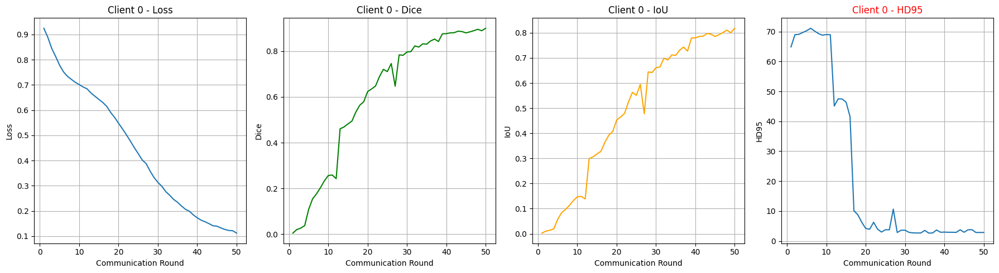

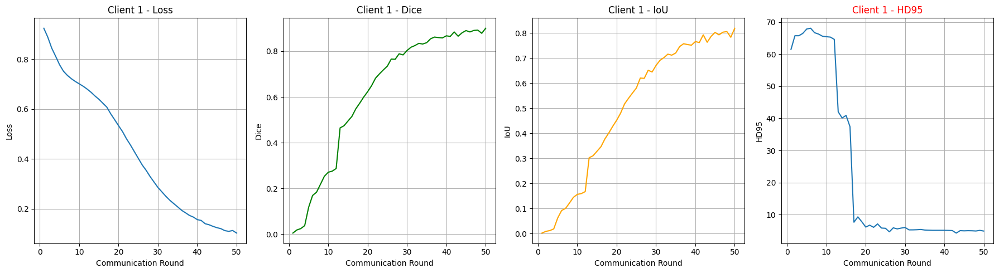

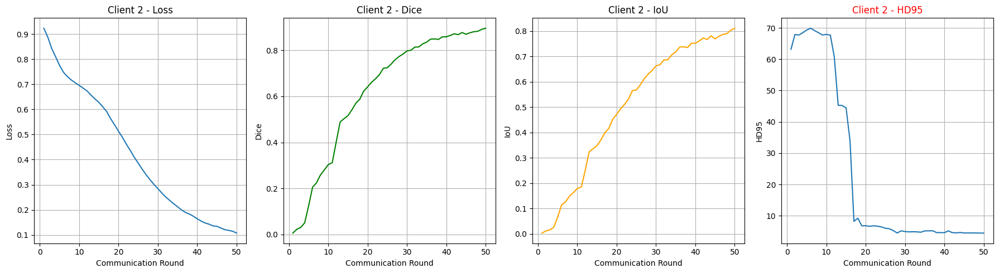

In [ ]:
#local clients per communication round

for client_id, metrics in client_history.items():

    rounds = range(1, len(metrics["dice"]) + 1)

    plt.figure(figsize=(18, 5))

    # ----------------------------
    # Loss
    # ----------------------------
    plt.subplot(1, 4, 1)
    plt.plot(rounds, metrics["loss"])
    plt.xlabel("Communication Round")
    plt.ylabel("Loss")
    plt.title(f"Client {client_id} - Loss")
    plt.grid(True)

    # ----------------------------
    # Dice
    # ----------------------------
    plt.subplot(1, 4, 2)
    plt.plot(rounds, metrics["dice"], color="green")
    plt.xlabel("Communication Round")
    plt.ylabel("Dice")
    plt.title(f"Client {client_id} - Dice")
    plt.grid(True)

    # ----------------------------
    # IoU
    # ----------------------------
    plt.subplot(1, 4, 3)
    plt.plot(rounds, metrics["iou"], color="orange")
    plt.xlabel("Communication Round")
    plt.ylabel("IoU")
    plt.title(f"Client {client_id} - IoU")
    plt.grid(True)

    # ----------------------------
    # HD95
    # ----------------------------
    plt.subplot(1, 4, 4)
    plt.plot(rounds, metrics["hd95"])
    plt.xlabel("Communication Round")
    plt.ylabel("HD95")
    plt.title(f"Client {client_id} - HD95", color="red")
    plt.grid(True)

    plt.tight_layout()
    plt.show()

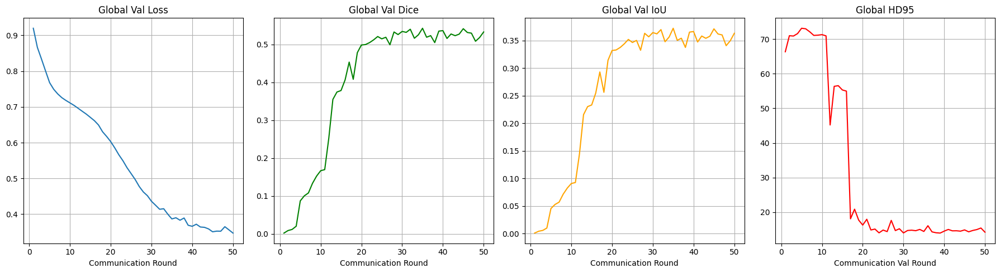

In [ ]:
# Global Model per Communication Round
rounds = range(1, len(global_history["dice"]) + 1)

plt.figure(figsize=(18, 5))

plt.subplot(1,4,1)
plt.plot(rounds, global_history["loss"])
plt.xlabel("Communication Round")
plt.title("Global Val Loss")
plt.grid(True)

plt.subplot(1,4,2)
plt.plot(rounds, global_history["dice"], color="green")
plt.xlabel("Communication Round")
plt.title("Global Val Dice")
plt.grid(True)

plt.subplot(1,4,3)
plt.plot(rounds, global_history["iou"], color="orange")
plt.xlabel("Communication Round")
plt.title("Global Val IoU")
plt.grid(True)

plt.subplot(1,4,4)
plt.plot(rounds, global_history["hd95"], color="red")
plt.xlabel("Communication Val Round")
plt.title("Global HD95")
plt.grid(True)

plt.tight_layout()
plt.show()

**Test Set and Segmentation**

In [ ]:
# -----------------------------
# 1️⃣ Load test set
# -----------------------------
test_dwi, test_masks = load_dwi_mask_pairs(os.path.join(data_dir, "test"))

test_dataset = ISLESDataset(
    dwi_files=test_dwi,
    mask_files=test_masks,
    image_transform=sample_transform,
    mask_transform=mask_transform
)

test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)
print("Test samples:", len(test_dataset))

# -----------------------------
# 2️⃣ Load best global model
# -----------------------------
best_model_ckpt = torch.load("best_global_model.pth")
global_model = create_model().to(device)
global_model.load_state_dict(best_model_ckpt["model_state_dict"])
global_model.eval()

# -----------------------------
# 3️⃣ Metrics setup
# -----------------------------
dice_metric = DiceMetric(include_background=False, reduction="mean")
hd_metric = HausdorffDistanceMetric(include_background=False, percentile=95, reduction="mean")

all_dice = []
all_hd95 = []
all_iou = []

from tqdm import tqdm

# -----------------------------
# 4️⃣ Evaluate on test set
# -----------------------------
global_model.eval()
all_dice = []
all_hd95 = []
all_iou = []

with torch.no_grad():
    test_bar = tqdm(test_loader, desc="Testing", leave=True)
    for batch_idx, batch in enumerate(test_bar):
        images = batch["image"].to(device, dtype=torch.float32)
        masks = batch["mask"].to(device, dtype=torch.float32)

        outputs = global_model(images)
        pred_binary = (torch.sigmoid(outputs) > 0.5).float()

        # Metrics
        dice_metric(pred_binary, masks)
        hd_metric(pred_binary, masks)

        # Optional: show running metrics in tqdm
        running_dice = dice_metric.aggregate().item()
        running_hd = hd_metric.aggregate().item()
        running_iou = running_dice / (2 - running_dice)
        test_bar.set_postfix({
            "Dice": f"{running_dice:.4f}",
            "IoU": f"{running_iou:.4f}",
            "HD95": f"{running_hd:.4f}"
        })

    # Final metrics
    mean_dice = dice_metric.aggregate().item()
    mean_hd95 = hd_metric.aggregate().item()
    mean_iou = mean_dice / (2 - mean_dice)

    print(f"\nTest Set Metrics:")
    print(f"Dice: {mean_dice:.4f}")
    print(f"IoU: {mean_iou:.4f}")
    print(f"HD95: {mean_hd95:.4f}")

    # Reset metrics for future use
    dice_metric.reset()
    hd_metric.reset()

C:\Users\LAB\AppData\Local\Temp\ipykernel_19916\1367524147.py:19: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  best_model_ckpt = torch.load("best_global_model.pth")


Test samples: 50
UNet(
  (model): Sequential(
    (0): ResidualUnit(
      (conv): Sequential(
        (unit0): Convolution(
          (conv): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
        (unit1): Convolution(
          (conv): Conv3d(16, 16, kernel_size=(3, 3, 3), stride=(1, 1, 1), padding=(1, 1, 1))
          (adn): ADN(
            (N): InstanceNorm3d(16, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
            (D): Dropout(p=0.0, inplace=False)
            (A): PReLU(num_parameters=1)
          )
        )
      )
      (residual): Conv3d(1, 16, kernel_size=(3, 3, 3), stride=(2, 2, 2), padding=(1, 1, 1))
    )
    (1): SkipConnection(
      (submodule): Sequential(
        (0): ResidualUnit(
   

Testing:   4%|▍         | 2/50 [00:00<00:02, 19.38it/s, Dice=0.2874, IoU=0.1678, HD95=14.4924]c:\Users\LAB\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:332: UserWarning: the prediction of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing:  52%|█████▏    | 26/50 [00:01<00:01, 16.70it/s, Dice=0.4135, IoU=0.2607, HD95=19.4468]c:\Users\LAB\AppData\Local\Programs\Python\Python311\Lib\site-packages\monai\metrics\utils.py:327: UserWarning: the ground truth of class 0 is all 0, this may result in nan/inf distance.
  warnings.warn(
Testing: 100%|██████████| 50/50 [00:02<00:00, 16.75it/s, Dice=0.5026, IoU=0.3356, HD95=16.3263]


Test Set Metrics:
Dice: 0.5026
IoU: 0.3356
HD95: 16.3263


**Visualize**

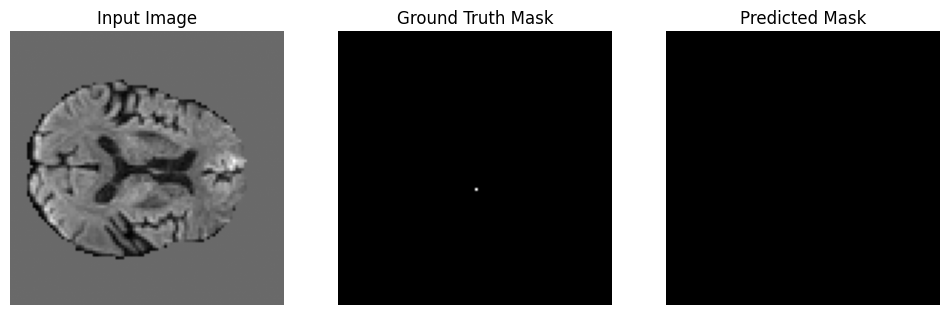

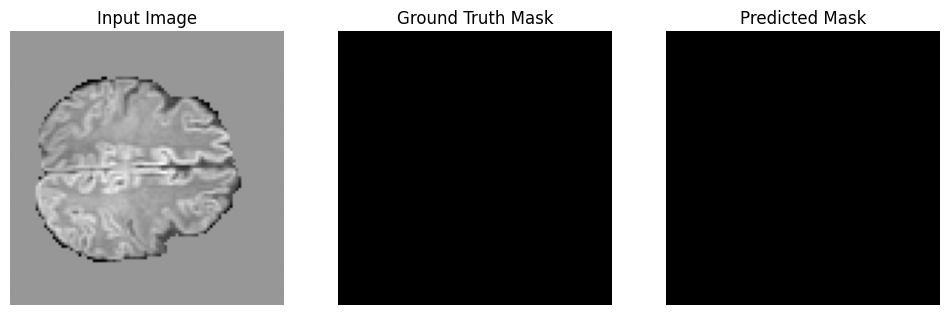

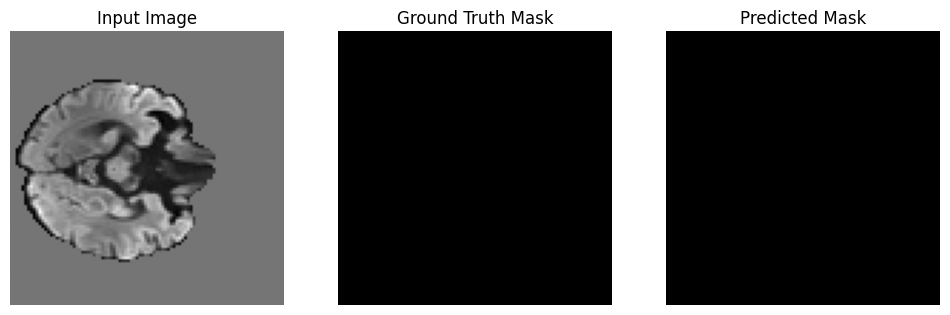

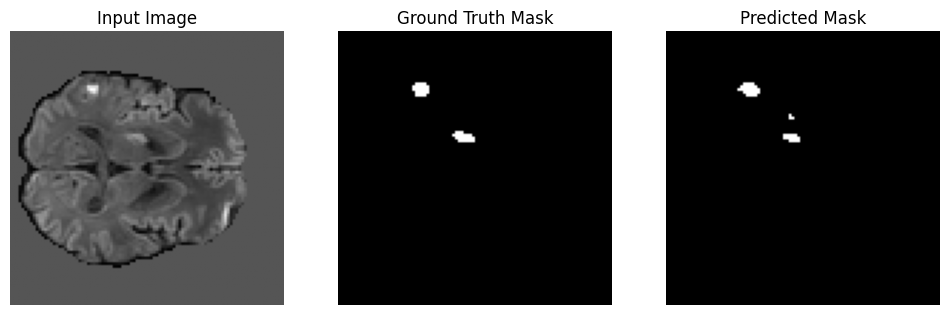

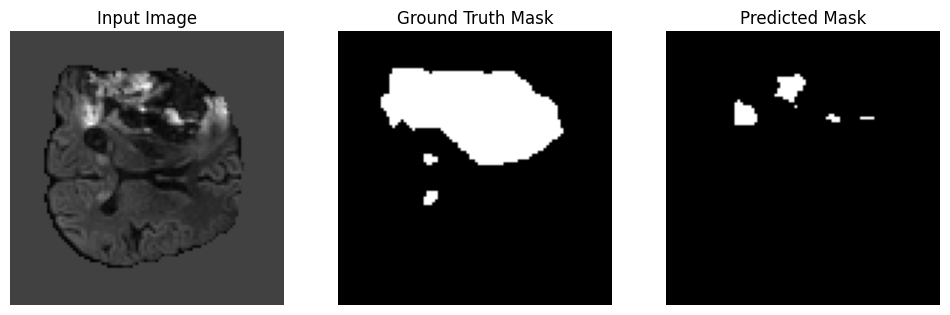

...

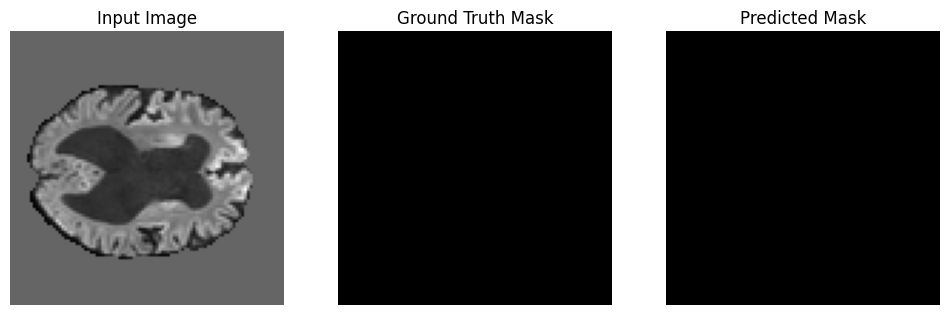

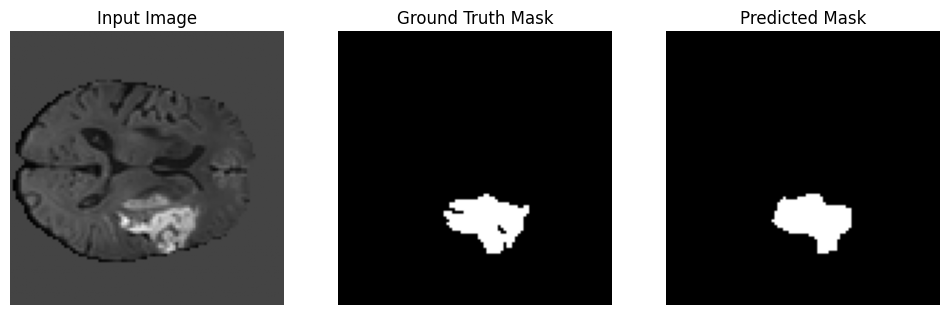

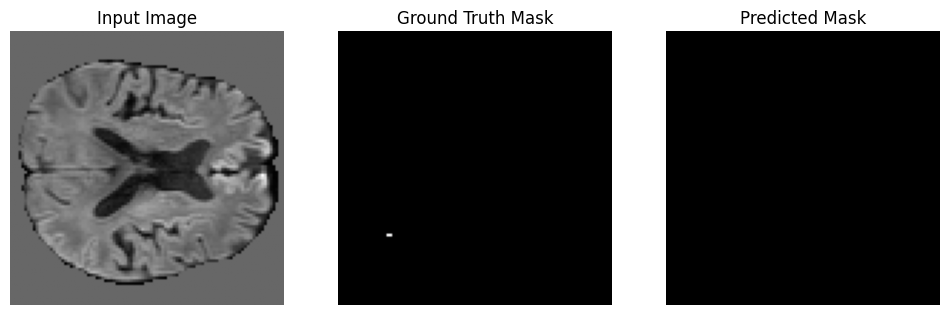

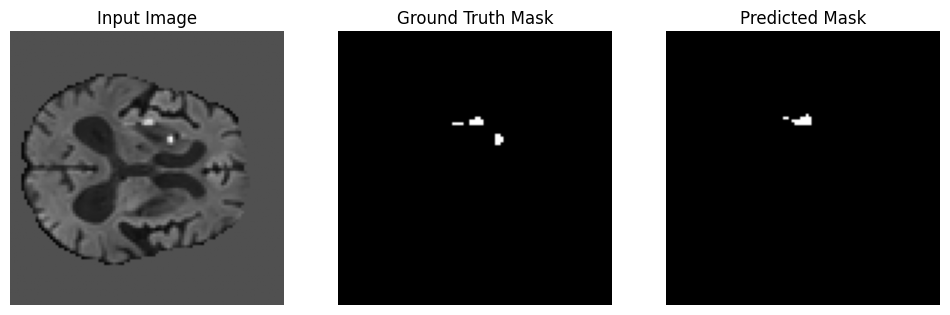

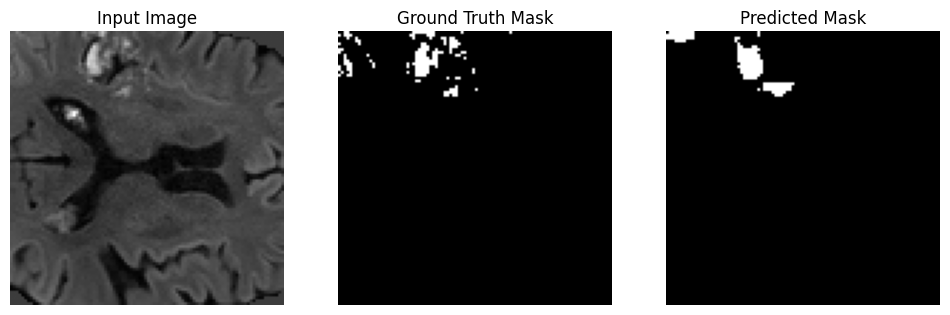

In [ ]:
num_visualize = len(test_dataset)

global_model.eval()

for i in range(num_visualize):
    sample = test_dataset[i]

    # Get tensors
    image_tensor = sample["image"].unsqueeze(0).to(device, dtype=torch.float32)
    mask_tensor  = sample["mask"]

    # Convert for visualization
    image = sample["image"][0].cpu().numpy()
    mask  = sample["mask"][0].cpu().numpy()

    # Predict
    with torch.no_grad():
        output = global_model(image_tensor)
        pred = (torch.sigmoid(output)[0, 0].cpu().numpy() > 0.5).astype(float)

    # Middle slice
    mid_slice = image.shape[2] // 2
    img_slice  = image[:, :, mid_slice]
    mask_slice = mask[:, :, mid_slice]
    pred_slice = pred[:, :, mid_slice]

    # Plot
    plt.figure(figsize=(12,4))

    plt.subplot(1,3,1)
    plt.imshow(img_slice, cmap="gray")
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1,3,2)
    plt.imshow(mask_slice, cmap="gray")
    plt.title("Ground Truth Mask")
    plt.axis("off")

    plt.subplot(1,3,3)
    plt.imshow(pred_slice, cmap="gray")
    plt.title("Predicted Mask")
    plt.axis("off")

    plt.show()